# Make FPP from STEP ODS

In [1]:
using Revise
using FUSE
using IMAS
using Plots;
FUSE.logging(Logging.Info; actors=Logging.Debug);

## Load in ODS

In [2]:
ini, act = FUSE.case_parameters(:FPP, version=:v1, init_from=:ods);
#ini.equilibrium.boundary_from = :ods;
ini.ods.filename = "__FUSE__/sample/highbatap_fpp_8MA_adhoc_EC.json"
#ini.ods.filename = "__FUSE__/sample/highbetap_fpp_325_ods.json"
act.ActorTGLF.user_specified_model = "sat0_es_d3d"

ini.equilibrium.xpoints = :double 
ini.equilibrium.ζ = -0.1


FUSE.ParametersInits{Float64}
├─ general
│  ├─ casename{String} ➡ "FPP_v1_ods" Sort mnemonic name of the case being run
│  ├─ description{String} ➡ missing Longer description of the case being run
│  ├─ init_from{Symbol} ➡ :ods Initialize run from [:ods, :scalars]
│  └─ dd{dd} ➡ missing `dd` to initialize from
├─ time
│  ├─ pulse_shedule_time_basis{AbstractRange{Float64}} ➡ missing Time basis used to discretize the pulse schedule
│  └─ simulation_start{Float64} ➡ 1.0 [s] Time at which the simulation starts
├─ gasc
│  ├─ filename{String} ➡ "__FUSE__/sample/FPPv1.0_aspectRatio3.5_PBpR35.json" Output GASC .json file from which data will be
│  │  loaded
│  └─ case{Int64} ➡ 0 Number of the GASC run to load
├─ ods
│  └─ filename{String} ➡ "__FUSE__/sample/highbatap_fpp_8MA_adhoc_EC.json" ODS.json file(s) from which equilibrium is loaded.
│     Multiple comma-separated ODSs can be specified.
├─ build
│  ├─ layers
│  │  ├─ 1
│  │  │  ├─ name{String} ➡ "gap OH" Name of the layer
│  │  │  ├─ thi

## Plot ODS results

In [3]:
dd = IMAS.dd();
FUSE.init(dd, ini, act; do_plot=false);

[ Info: Equilibrium


[ Info:  TEQUILA


[ Info: HCD


[ Info: CXbuild


In [4]:
# delete qfuse and qfusi sources from STEP ods file 
# this avoids double-counting of fusion power

deleteat!(dd.core_sources.source, "identifier.name" => "qfuse");
deleteat!(dd.core_sources.source, "identifier.name" => "qfusi");


In [5]:
rho_transport = 0.25:0.05:0.85

FUSE.ActorFluxCalculator(dd, act; rho_transport=rho_transport);

[ Info: FluxCalculator
[ Info:  TGLF


[ Info:  Neoclassical


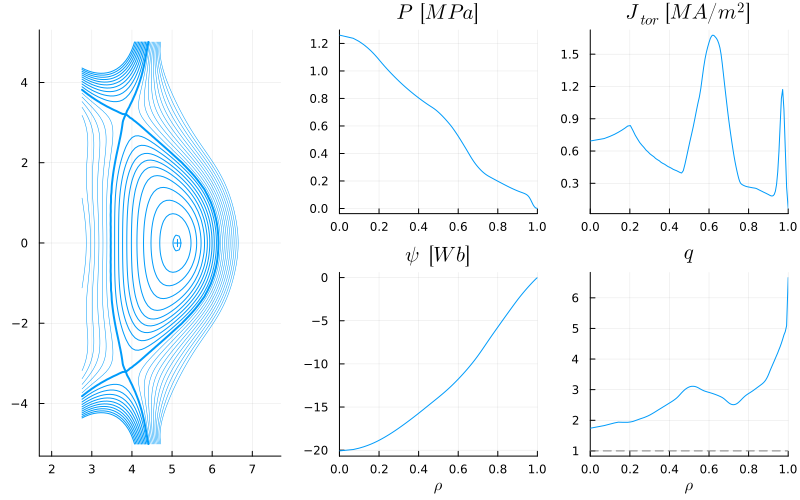

In [6]:
plot(dd.equilibrium, coordinate=:rho_tor_norm)

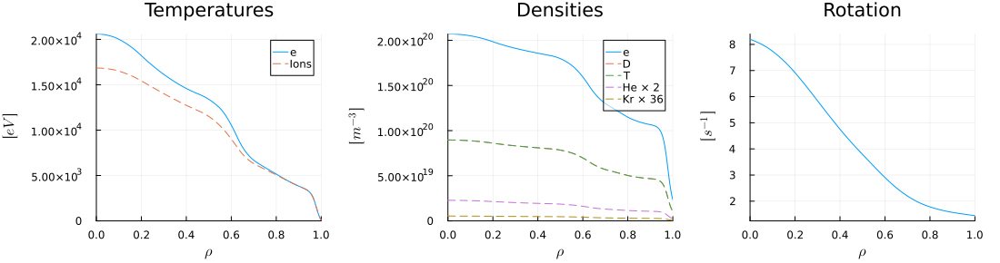

In [7]:
plot(dd.core_profiles)

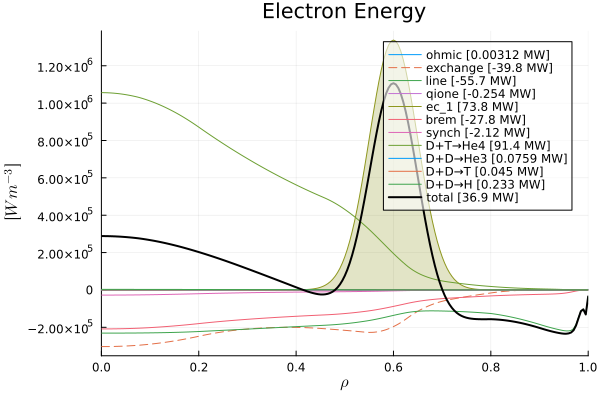

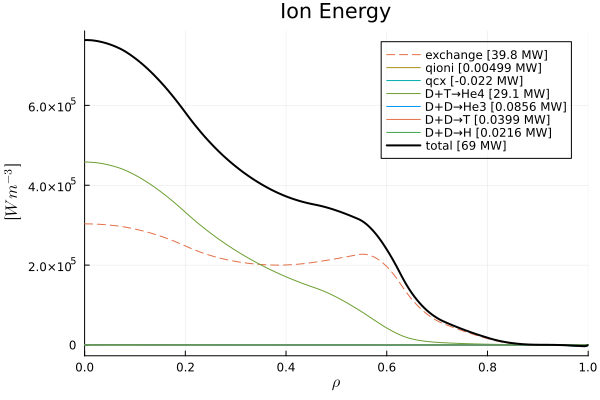

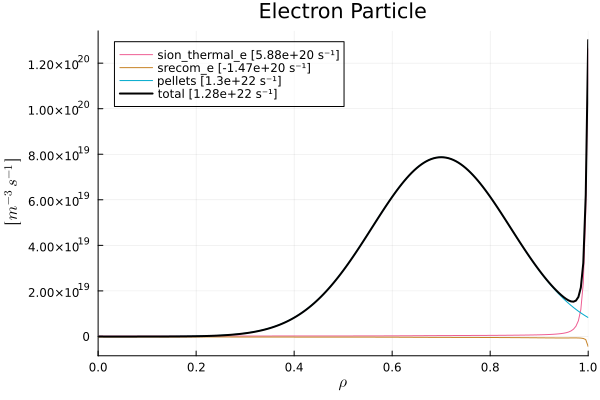

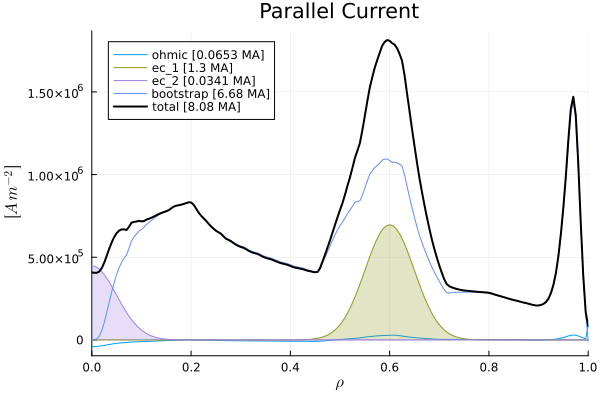

In [8]:
display(plot(dd.core_sources, only=1))
display(plot(dd.core_sources, only=2))
display(plot(dd.core_sources, only=3))
display(plot(dd.core_sources, only=4))


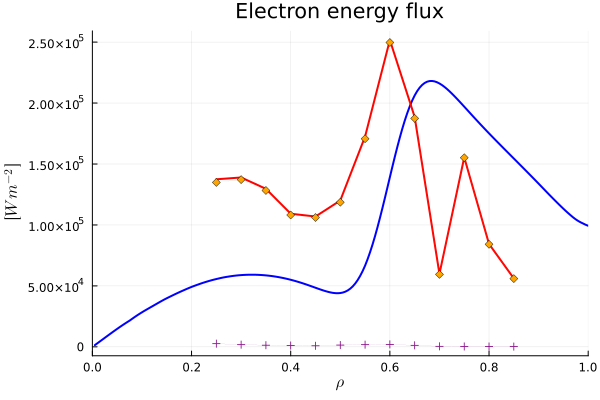

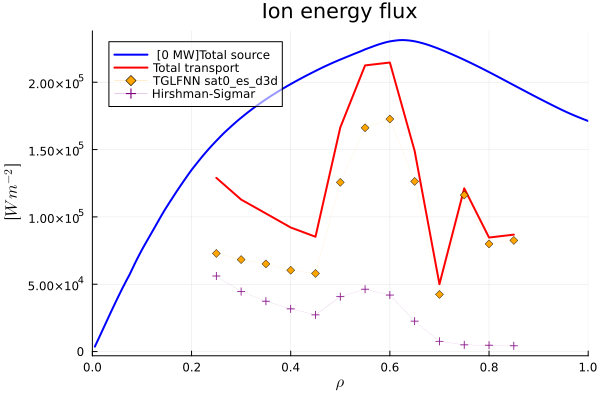

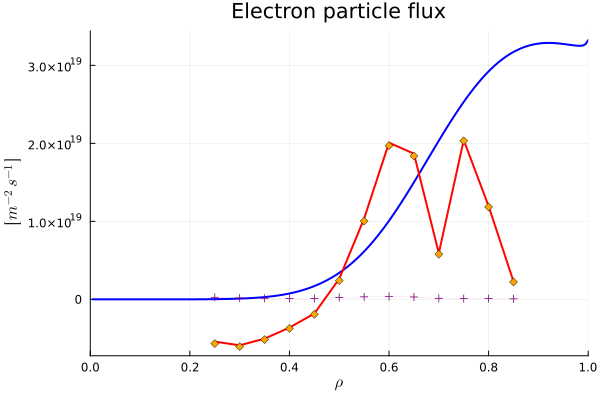

In [9]:
display(plot(dd.core_transport, only=1))
display(plot(dd.core_transport, only=2))
display(plot(dd.core_transport, only=3))

## Run Stationary Plasma actors

In [10]:
act.ActorCoreTransport.model = :FluxMatcher

act.ActorFluxMatcher.evolve_densities = :fixed
act.ActorFluxMatcher.verbose = true
act.ActorFluxMatcher.rho_transport = rho_transport

act.ActorStationaryPlasma.verbose = true

act.ActorPedestal.rho_nml = rho_transport[end-1]
act.ActorPedestal.rho_ped = rho_transport[end]

act.ActorTEQUILA.free_boundary = true

act.ActorPedestal.update_core_profiles = false

act.ActorTEQUILA.number_of_MXH_harmonics = 6
act.ActorTEQUILA.relax = 0.8
act.ActorTEQUILA.number_of_radial_grid_points = 21
act.ActorTEQUILA.debug = true


true

In [11]:

run_stationary_plasma = true

if run_stationary_plasma

    FUSE.ActorStationaryPlasma(dd, act)

else

    FUSE.ActorHCD(dd, act);
    FUSE.ActorCurrent(dd, act; ip_from=:pulse_schedule, vloop_from=:pulse_schedule);

    for i in range(1,2)

        println("iter ", i)

        FUSE.ActorCoreTransport(dd, act);
        FUSE.ActorPedestal(dd, act; ip_from=:core_profiles, βn_from=:equilibrium);
        FUSE.ActorHCD(dd, act);
        FUSE.ActorCurrent(dd, act; ip_from=:pulse_schedule, vloop_from=:pulse_schedule);
        FUSE.ActorEquilibrium(dd, act; ip_from=:core_profiles);

    end

end

[ Info: StationaryPlasma


Progress:   6%|█▊                         |  ETA: 0:00:17 ( 0.56  s/it)
           iteration (min 2):  0/5
  required convergence error:  0.05
         convergence history:  N/A
                       stage:  Current
                     Ip [MA]:  7.99970478
                   Te0 [keV]:  20.592414









Progress:   9%|██▌                        |  ETA: 0:00:45 ( 1.54  s/it)
           iteration (min 2):  0/5
  required convergence error:  0.05
         convergence history:  N/A
                       stage:  CoreTransport
                     Ip [MA]:  7.99970478
                   Te0 [keV]:  20.592414


Calls: 2    Time: 0:00:05
           error:  3.0615845362004537
    Pfusion [MW]:  566.1126338783931
       Ti0 [keV]:  16.535463628009122
       Te0 [keV]:  19.67581698683976







Calls: 3    Time: 0:00:05
           error:  2.711087301506291
    Pfusion [MW]:  595.3335421176854
       Ti0 [keV]:  17.078480668304703
       Te0 [keV]:  19.22831830780118







Calls: 4    Time: 0:00:05
           error:  2.5414607740858832
    Pfusion [MW]:  665.4054311936623
       Ti0 [keV]:  18.352438490157223
       Te0 [keV]:  19.999453330161767







Calls: 5    Time: 0:00:06
           error:  2.362440361509642
    Pfusion [MW]:  720.279829459072
       Ti0 [keV]:  19.347139961949726
       Te0 [keV]:  21.261588975545912







Calls: 6    Time: 0:00:06
           error:  2.63118005443915
    Pfusion [MW]:  626.4144772430213
       Ti0 [keV]:  17.631429092693804
       Te0 [keV]:  19.50140480126945







Calls: 8    Time: 0:00:06
           error:  2.08206982819941
    Pfusion [MW]:  750.4572471843653
       Ti0 [keV]:  19.7821234871263
       Te0 [keV]:  21.5720169603582







Calls: 9    Time: 0:00:06
           error:  2.2562950464148637
    Pfusion [MW]:  666.6191181254927
       Ti0 [keV]:  18.263447711996314
       Te0 [keV]:  20.665659123960996







Calls: 10    Time: 0:00:06
           error:  2.2281084240162787
    Pfusion [MW]:  838.2477484153271
       Ti0 [keV]:  20.994062768204852
       Te0 [keV]:  23.7430707524283







Calls: 12    Time: 0:00:07
           error:  1.4384062186847915
    Pfusion [MW]:  792.6003124671263
       Ti0 [keV]:  20.174330838665416
       Te0 [keV]:  22.24456722570249







Calls: 14    Time: 0:00:07
           error:  1.2967711494869278
    Pfusion [MW]:  781.0448417886997
       Ti0 [keV]:  19.943134273327356
       Te0 [keV]:  22.31173475281486







Calls: 16    Time: 0:00:07
           error:  1.1008862077295432
    Pfusion [MW]:  767.1700707063806
       Ti0 [keV]:  19.782349409573797
       Te0 [keV]:  21.97032780765434







Calls: 18    Time: 0:00:07
           error:  1.0917554907894218
    Pfusion [MW]:  766.2328178377198
       Ti0 [keV]:  19.77150860682358
       Te0 [keV]:  21.94095523042454







Calls: 19    Time: 0:00:07
           error:  1.02255427368628
    Pfusion [MW]:  756.1244857504782
       Ti0 [keV]:  19.60200577446414
       Te0 [keV]:  21.58107430919299







Calls: 21    Time: 0:00:08
           error:  0.9335581754109142
    Pfusion [MW]:  741.8861919083156
       Ti0 [keV]:  19.394309214468468
       Te0 [keV]:  21.52344107894814







Calls: 23    Time: 0:00:08
           error:  0.6464849393077386
    Pfusion [MW]:  765.3666497471723
       Ti0 [keV]:  19.966142465723145
       Te0 [keV]:  22.01837418251119







Calls: 25    Time: 0:00:08
           error:  0.6087683617995563
    Pfusion [MW]:  775.4276288799877
       Ti0 [keV]:  20.111988310010993
       Te0 [keV]:  22.207467403765875







Calls: 27    Time: 0:00:08
           error:  0.43440272355678305
    Pfusion [MW]:  777.4123780663881
       Ti0 [keV]:  20.174963266993185
       Te0 [keV]:  22.175444698775614







Calls: 29    Time: 0:00:08
           error:  0.3588265866676643
    Pfusion [MW]:  791.8343134717317
       Ti0 [keV]:  20.412652560402428
       Te0 [keV]:  22.411599728975304







Calls: 31    Time: 0:00:09
           error:  0.28783699234273646
    Pfusion [MW]:  795.3054440670088
       Ti0 [keV]:  20.4556018804221
       Te0 [keV]:  22.534689017798815







Calls: 32    Time: 0:00:09
           error:  0.28291828227897886
    Pfusion [MW]:  797.0012247651707
       Ti0 [keV]:  20.476480502689334
       Te0 [keV]:  22.562452809126544







Calls: 34    Time: 0:00:09
           error:  0.19621129354556685
    Pfusion [MW]:  797.8242656976804
       Ti0 [keV]:  20.422205286036682
       Te0 [keV]:  22.5193107860763







Calls: 36    Time: 0:00:09
           error:  0.07527508334111274
    Pfusion [MW]:  798.8952250006126
       Ti0 [keV]:  20.39446757666935
       Te0 [keV]:  22.446055147259287







Calls: 38    Time: 0:00:09
           error:  0.05097055621327296
    Pfusion [MW]:  797.0730653664343
       Ti0 [keV]:  20.361639585226982
       Te0 [keV]:  22.434806670621704







Calls: 40    Time: 0:00:10
           error:  0.04039879778753377
    Pfusion [MW]:  796.3181154659616
       Ti0 [keV]:  20.347171496774333
       Te0 [keV]:  22.414809882776833







Calls: 41    Time: 0:00:10
           error:  0.0399547269832114
    Pfusion [MW]:  796.2814387131136
       Ti0 [keV]:  20.34642810131973
       Te0 [keV]:  22.412787783100814







Calls: 43    Time: 0:00:10
           error:  0.03753187852111185
    Pfusion [MW]:  796.0368747361996
       Ti0 [keV]:  20.34386451351748
       Te0 [keV]:  22.408529442415105







Calls: 45    Time: 0:00:10
           error:  0.03333909145344891
    Pfusion [MW]:  796.322329615909
       Ti0 [keV]:  20.35088208533349
       Te0 [keV]:  22.408448900722817







Calls: 47    Time: 0:00:10
           error:  0.03254193243470973
    Pfusion [MW]:  796.4397697622805
       Ti0 [keV]:  20.352139153496974
       Te0 [keV]:  22.413342701494226







Calls: 49    Time: 0:00:10
           error:  0.030775628616903753
    Pfusion [MW]:  796.4746995581331
       Ti0 [keV]:  20.353134137815374
       Te0 [keV]:  22.414114989579353







Calls: 50    Time: 0:00:11
           error:  0.02853188458653385
    Pfusion [MW]:  796.5953014265225
       Ti0 [keV]:  20.35749285756564
       Te0 [keV]:  22.416411385693713







Calls: 52    Time: 0:00:11
           error:  0.02786145723993903
    Pfusion [MW]:  796.6078371224104
       Ti0 [keV]:  20.356700029712222
       Te0 [keV]:  22.41448714500253







Calls: 54    Time: 0:00:11
           error:  0.02126786704495596
    Pfusion [MW]:  795.753517432904
       Ti0 [keV]:  20.343477678850462
       Te0 [keV]:  22.404559746725784







Calls: 56    Time: 0:00:11
           error:  0.018791552764080895
    Pfusion [MW]:  795.342979558349
       Ti0 [keV]:  20.338258535418273
       Te0 [keV]:  22.401860690333383







Calls: 58    Time: 0:00:11
           error:  0.01292467588185654
    Pfusion [MW]:  794.2074384686011
       Ti0 [keV]:  20.321251453251026
       Te0 [keV]:  22.3872350408723







Calls: 59    Time: 0:00:12
           error:  0.011709096750634055
    Pfusion [MW]:  794.2391547000915
       Ti0 [keV]:  20.321415925410513
       Te0 [keV]:  22.383658638660282







Calls: 61    Time: 0:00:12
           error:  0.011160735660695253
    Pfusion [MW]:  794.1562314642694
       Ti0 [keV]:  20.320454454538755
       Te0 [keV]:  22.383612975800716







Calls: 63    Time: 0:00:12
           error:  0.010561440190657604
    Pfusion [MW]:  794.35508669704
       Ti0 [keV]:  20.32337233113748
       Te0 [keV]:  22.386210350654054







Calls: 65    Time: 0:00:12
           error:  0.01006523086306873
    Pfusion [MW]:  794.58778379604
       Ti0 [keV]:  20.327029630387813
       Te0 [keV]:  22.39074102597561









Progress:  12%|███▍                       |  ETA: 0:02:07 ( 4.54  s/it)
           iteration (min 2):  0/5
  required convergence error:  0.05
         convergence history:  N/A
                       stage:  Pedestal
                     Ip [MA]:  7.99970478
                   Te0 [keV]:  20.592414









Progress:  16%|████▎                      |  ETA: 0:01:43 ( 3.82  s/it)
           iteration (min 2):  0/5
  required convergence error:  0.05
         convergence history:  N/A
                       stage:  HCD
                     Ip [MA]:  7.99970478
                   Te0 [keV]:  20.592414









Progress:  22%|█████▉                     |  ETA: 0:01:08 ( 2.73  s/it)
           iteration (min 2):  0/5
  required convergence error:  0.05
         convergence history:  N/A
                       stage:  Equilibrium
                     Ip [MA]:  7.99970478
                   Te0 [keV]:  20.592414


ITERATION 1


    Concentric surfaces used for first iteration
    Status: Ψaxis = -21.184871372631008, Error: 1.0
ITERATION 2


    Status: Ψaxis = -24.089834371496174, Error: 0.12058874934824819
ITERATION 3


    Status: Ψaxis = -22.430135359206083, Error: 0.07399415945160108
ITERATION 4


    Status: Ψaxis = -21.89417750926075, Error: 0.024479469471672788
ITERATION 5


    Status: Ψaxis = -21.375001546086974, Error: 0.02428893219279412
ITERATION 6


    Status: Ψaxis = -21.24375951100261, Error: 0.006177910035951463
ITERATION 7


    Status: Ψaxis = -21.077536115102877, Error: 0.007886282105840125
ITERATION 8


    Status: Ψaxis = -21.042310001317546, Error: 0.0016740611550312434
ITERATION 9


    Status: Ψaxis = -20.97917143072475, Error: 0.0030095836149337148
ITERATION 10


    Status: Ψaxis = -20.96834210676393, Error: 0.0005164606674996419
DONE: Successful convergence









Progress:  25%|██████▊                    |  ETA: 0:01:23 ( 3.44  s/it)
           iteration (min 2):  1/5
  required convergence error:  0.05
         convergence history:  [0.03556832958594928]
                       stage:  CoreTransport
                     Ip [MA]:  7.99970478
                   Te0 [keV]:  20.592414


Calls: 2    Time: 0:00:00
           error:  10.591323296629843
    Pfusion [MW]:  732.217427395663
       Ti0 [keV]:  19.33918467074648
       Te0 [keV]:  20.029429139581826







Calls: 4    Time: 0:00:00
           error:  1.857859162217749
    Pfusion [MW]:  458.9389650443378
       Ti0 [keV]:  15.119097677424335
       Te0 [keV]:  15.42533785351041







Calls: 6    Time: 0:00:00
           error:  1.6729665704464738
    Pfusion [MW]:  445.7575647322738
       Ti0 [keV]:  14.855304968484628
       Te0 [keV]:  15.83997084810265







Calls: 8    Time: 0:00:00
           error:  4.672760250084367
    Pfusion [MW]:  563.0093404170442
       Ti0 [keV]:  16.674656059720583
       Te0 [keV]:  17.556793836146632







Calls: 10    Time: 0:00:01
           error:  0.9893977795440845
    Pfusion [MW]:  387.39740285909494
       Ti0 [keV]:  13.855764943124687
       Te0 [keV]:  14.314297693156131







Calls: 12    Time: 0:00:01
           error:  1.6070017148379412
    Pfusion [MW]:  315.10025342795507
       Ti0 [keV]:  12.454332734174136
       Te0 [keV]:  12.495589103016291







Calls: 13    Time: 0:00:01
           error:  2.5140959532349823
    Pfusion [MW]:  398.6267950841776
       Ti0 [keV]:  13.813533365708484
       Te0 [keV]:  14.284819164172772







Calls: 15    Time: 0:00:01
           error:  1.222067473912363
    Pfusion [MW]:  322.3762772188658
       Ti0 [keV]:  12.332109044963065
       Te0 [keV]:  12.647977532729822







Calls: 17    Time: 0:00:01
           error:  1.0600254350223022
    Pfusion [MW]:  334.31062631339705
       Ti0 [keV]:  12.57694788225716
       Te0 [keV]:  13.00491674631891







Calls: 18    Time: 0:00:01
           error:  0.47389862323941045
    Pfusion [MW]:  321.6288228121528
       Ti0 [keV]:  12.291250709866725
       Te0 [keV]:  12.791429523013091







Calls: 20    Time: 0:00:02
           error:  0.35765084567593575
    Pfusion [MW]:  324.27679133347533
       Ti0 [keV]:  12.388095076328765
       Te0 [keV]:  12.874722969246424







Calls: 22    Time: 0:00:02
           error:  0.4049221538327549
    Pfusion [MW]:  319.57444907141286
       Ti0 [keV]:  12.247162878800205
       Te0 [keV]:  12.739712693090393







Calls: 24    Time: 0:00:02
           error:  0.3387095927596398
    Pfusion [MW]:  322.2505770556165
       Ti0 [keV]:  12.329482224223574
       Te0 [keV]:  12.833788201712757







Calls: 26    Time: 0:00:02
           error:  0.26019908251512214
    Pfusion [MW]:  293.48451263978546
       Ti0 [keV]:  11.757654302033691
       Te0 [keV]:  11.913356511522366







Calls: 27    Time: 0:00:02
           error:  0.2774019874830932
    Pfusion [MW]:  307.4616773337318
       Ti0 [keV]:  12.06207561172578
       Te0 [keV]:  12.25472411851529







Calls: 29    Time: 0:00:03
           error:  0.26029649465632715
    Pfusion [MW]:  292.6013406830883
       Ti0 [keV]:  11.722708061850868
       Te0 [keV]:  11.896556756001848







Calls: 31    Time: 0:00:03
           error:  0.257175708784725
    Pfusion [MW]:  291.9036600020889
       Ti0 [keV]:  11.709877077260527
       Te0 [keV]:  11.886320605441927







Calls: 32    Time: 0:00:03
           error:  0.25377117036622615
    Pfusion [MW]:  293.20614740166803
       Ti0 [keV]:  11.729525518308481
       Te0 [keV]:  11.954225962259018







Calls: 34    Time: 0:00:03
           error:  0.2533739771836288
    Pfusion [MW]:  291.19694906329494
       Ti0 [keV]:  11.689229369351416
       Te0 [keV]:  11.903479581812125







Calls: 36    Time: 0:00:03
           error:  0.2536331383030095
    Pfusion [MW]:  291.4589660914847
       Ti0 [keV]:  11.693293772992316
       Te0 [keV]:  11.910339872306505







Calls: 38    Time: 0:00:04
           error:  0.2521578441121339
    Pfusion [MW]:  292.08357599084076
       Ti0 [keV]:  11.71304263443079
       Te0 [keV]:  11.916025996204375







Calls: 40    Time: 0:00:04
           error:  0.25171627514241895
    Pfusion [MW]:  291.2771131561485
       Ti0 [keV]:  11.692156294547244
       Te0 [keV]:  11.883172011076965







Calls: 41    Time: 0:00:04
           error:  0.25190051529220053
    Pfusion [MW]:  290.357135519114
       Ti0 [keV]:  11.67474393464119
       Te0 [keV]:  11.86456423404669







Calls: 43    Time: 0:00:04
           error:  0.251209248783233
    Pfusion [MW]:  292.1167979251952
       Ti0 [keV]:  11.714962597738047
       Te0 [keV]:  11.899909781837648







Calls: 45    Time: 0:00:04
           error:  0.2502742946359162
    Pfusion [MW]:  293.711209468968
       Ti0 [keV]:  11.746723411054317
       Te0 [keV]:  11.93360989991083







Calls: 46    Time: 0:00:04
           error:  0.25020506478690774
    Pfusion [MW]:  294.10480933464714
       Ti0 [keV]:  11.755090061563735
       Te0 [keV]:  11.945816207489038







Calls: 48    Time: 0:00:05
           error:  0.25017647945761456
    Pfusion [MW]:  294.025564260489
       Ti0 [keV]:  11.749492277507105
       Te0 [keV]:  11.949657192683699







Calls: 50    Time: 0:00:05
           error:  0.25010827468534397
    Pfusion [MW]:  294.6293811769609
       Ti0 [keV]:  11.761066952476083
       Te0 [keV]:  11.962073646465337







Calls: 52    Time: 0:00:05
           error:  0.2500735377624797
    Pfusion [MW]:  294.4586762257954
       Ti0 [keV]:  11.756807365259812
       Te0 [keV]:  11.958437266176782







Calls: 54    Time: 0:00:05
           error:  0.25007580486860814
    Pfusion [MW]:  294.519352286911
       Ti0 [keV]:  11.757774454967784
       Te0 [keV]:  11.961112723997541







Calls: 55    Time: 0:00:05
           error:  0.25010823085614564
    Pfusion [MW]:  294.0564163790441
       Ti0 [keV]:  11.747134829362821
       Te0 [keV]:  11.949582822365015







Calls: 57    Time: 0:00:06
           error:  0.2500813473497116
    Pfusion [MW]:  294.12756761082693
       Ti0 [keV]:  11.750154180028575
       Te0 [keV]:  11.951525450829434







Calls: 59    Time: 0:00:06
           error:  0.2500971160333124
    Pfusion [MW]:  294.40317369768144
       Ti0 [keV]:  11.756240464365444
       Te0 [keV]:  11.95709710199137







Calls: 60    Time: 0:00:06
           error:  0.25007473698755206
    Pfusion [MW]:  294.399501166045
       Ti0 [keV]:  11.755218823402206
       Te0 [keV]:  11.958205422393005







Calls: 62    Time: 0:00:06
           error:  0.2500979767578842
    Pfusion [MW]:  294.17168129515227
       Ti0 [keV]:  11.749384315735798
       Te0 [keV]:  11.951377357643471







Calls: 64    Time: 0:00:06
           error:  0.2500715556216702
    Pfusion [MW]:  294.5008413752745
       Ti0 [keV]:  11.756968324612425
       Te0 [keV]:  11.959384549221623







Calls: 66    Time: 0:00:07
           error:  0.2500883906001259
    Pfusion [MW]:  294.2386390944603
       Ti0 [keV]:  11.75287739513713
       Te0 [keV]:  11.952885394137608







Calls: 68    Time: 0:00:07
           error:  0.2500670428935524
    Pfusion [MW]:  294.3630012724987
       Ti0 [keV]:  11.754355812232168
       Te0 [keV]:  11.955910345563







Calls: 69    Time: 0:00:07
           error:  0.2500316395395078
    Pfusion [MW]:  293.03520171445786
       Ti0 [keV]:  11.725245854996466
       Te0 [keV]:  11.927146932698564







Calls: 71    Time: 0:00:07
           error:  0.2500472617893934
    Pfusion [MW]:  293.28655546419753
       Ti0 [keV]:  11.731987720754853
       Te0 [keV]:  11.933179062195965







Calls: 73    Time: 0:00:07
           error:  0.24998781255521385
    Pfusion [MW]:  293.54170604034306
       Ti0 [keV]:  11.736272517755701
       Te0 [keV]:  11.93911837206722







Calls: 74    Time: 0:00:07
           error:  0.2500256287165538
    Pfusion [MW]:  293.83038945461556
       Ti0 [keV]:  11.741750038987059
       Te0 [keV]:  11.94721338970573







Calls: 76    Time: 0:00:08
           error:  0.25000165032714705
    Pfusion [MW]:  293.4767008793306
       Ti0 [keV]:  11.735045525005185
       Te0 [keV]:  11.938179586079649







Calls: 78    Time: 0:00:08
           error:  0.25002971420340175
    Pfusion [MW]:  293.3531152694974
       Ti0 [keV]:  11.732889285547904
       Te0 [keV]:  11.93526263577926







Calls: 80    Time: 0:00:08
           error:  0.2500597174085768
    Pfusion [MW]:  293.36443046393094
       Ti0 [keV]:  11.733916389871007
       Te0 [keV]:  11.936125164420586







Calls: 82    Time: 0:00:08
           error:  0.25000518348468465
    Pfusion [MW]:  293.4346561599463
       Ti0 [keV]:  11.733988188763517
       Te0 [keV]:  11.937420345520035







Calls: 83    Time: 0:00:08
           error:  0.25005771665516285
    Pfusion [MW]:  293.17540051351585
       Ti0 [keV]:  11.727830782921743
       Te0 [keV]:  11.93302667644299







Calls: 85    Time: 0:00:08
           error:  0.24999800679200915
    Pfusion [MW]:  293.8325223526225
       Ti0 [keV]:  11.74310130059613
       Te0 [keV]:  11.945668661638388







Calls: 87    Time: 0:00:09
           error:  0.2500249032146191
    Pfusion [MW]:  293.7696428150395
       Ti0 [keV]:  11.742393882306713
       Te0 [keV]:  11.944349395263178







Calls: 88    Time: 0:00:09
           error:  0.24999996618730902
    Pfusion [MW]:  293.93911867837795
       Ti0 [keV]:  11.744725982789523
       Te0 [keV]:  11.948353354455788







Calls: 90    Time: 0:00:09
           error:  0.25001973106685055
    Pfusion [MW]:  293.50909809390544
       Ti0 [keV]:  11.735566698891173
       Te0 [keV]:  11.939108120286559







Calls: 92    Time: 0:00:09
           error:  0.25003699160043497
    Pfusion [MW]:  293.8945292515444
       Ti0 [keV]:  11.742873585056126
       Te0 [keV]:  11.947511961408852







Calls: 94    Time: 0:00:09
           error:  0.24999449225775447
    Pfusion [MW]:  293.9105406308995
       Ti0 [keV]:  11.74404545340844
       Te0 [keV]:  11.947020150124604







Calls: 96    Time: 0:00:10
           error:  0.2500584392242423
    Pfusion [MW]:  293.89758642727105
       Ti0 [keV]:  11.744203999215486
       Te0 [keV]:  11.94664318966707







Calls: 97    Time: 0:00:10
           error:  0.2500063803289484
    Pfusion [MW]:  293.6344142711439
       Ti0 [keV]:  11.738599247820636
       Te0 [keV]:  11.940477026813921







Calls: 99    Time: 0:00:10
           error:  0.25002465172606186
    Pfusion [MW]:  294.0132694581732
       Ti0 [keV]:  11.745834395637857
       Te0 [keV]:  11.948754092654962







Calls: 101    Time: 0:00:10
           error:  0.2500107303058428
    Pfusion [MW]:  294.2606574908496
       Ti0 [keV]:  11.751118955437237
       Te0 [keV]:  11.955963259209849







Calls: 102    Time: 0:00:10
           error:  0.2500467607288065
    Pfusion [MW]:  294.0233859807519
       Ti0 [keV]:  11.747642311306834
       Te0 [keV]:  11.950662929599913







Calls: 104    Time: 0:00:10
           error:  0.25000839347945225
    Pfusion [MW]:  294.40543793494896
       Ti0 [keV]:  11.754962262920797
       Te0 [keV]:  11.957693569353635







Calls: 106    Time: 0:00:11
           error:  0.24999331009874634
    Pfusion [MW]:  294.10760129779055
       Ti0 [keV]:  11.748788954878345
       Te0 [keV]:  11.95097825251297







Calls: 108    Time: 0:00:11
           error:  0.2499940534154141
    Pfusion [MW]:  294.24535928903396
       Ti0 [keV]:  11.75082400578219
       Te0 [keV]:  11.954811544018012







Calls: 110    Time: 0:00:11
           error:  0.2500296157207548
    Pfusion [MW]:  294.1197496700098
       Ti0 [keV]:  11.74863052979361
       Te0 [keV]:  11.950811434792948







Calls: 111    Time: 0:00:11
           error:  0.24999892941634064
    Pfusion [MW]:  294.0876786326928
       Ti0 [keV]:  11.747709429560366
       Te0 [keV]:  11.951069126008795







Calls: 112    Time: 0:00:11
           error:  0.25003971212922527
    Pfusion [MW]:  294.69210867753173
       Ti0 [keV]:  11.760594078571316
       Te0 [keV]:  11.966666768732463







Calls: 114    Time: 0:00:12
           error:  0.25000768673787677
    Pfusion [MW]:  294.5000225566235
       Ti0 [keV]:  11.755785185418107
       Te0 [keV]:  11.961093676408039







Calls: 116    Time: 0:00:12
           error:  0.2500007632235005
    Pfusion [MW]:  294.3664154170273
       Ti0 [keV]:  11.754617211316948
       Te0 [keV]:  11.956801258512078







Calls: 118    Time: 0:00:12
           error:  0.25008332020746976
    Pfusion [MW]:  294.65745539603915
       Ti0 [keV]:  11.760434907598288
       Te0 [keV]:  11.963513074383085







Calls: 120    Time: 0:00:12
           error:  0.24998671271588851
    Pfusion [MW]:  294.0356161615244
       Ti0 [keV]:  11.746735726301175
       Te0 [keV]:  11.94787499981501







Calls: 122    Time: 0:00:12
           error:  0.24998637321677525
    Pfusion [MW]:  294.08539096003705
       Ti0 [keV]:  11.748359776361301
       Te0 [keV]:  11.949628870222984







Calls: 124    Time: 0:00:13
           error:  0.2500032753291405
    Pfusion [MW]:  294.0540062616289
       Ti0 [keV]:  11.74717679309281
       Te0 [keV]:  11.950007904866748







Calls: 125    Time: 0:00:13
           error:  0.2500494890710684
    Pfusion [MW]:  294.448244362186
       Ti0 [keV]:  11.756092381947084
       Te0 [keV]:  11.957639461079074







Calls: 127    Time: 0:00:13
           error:  0.2500685031130862
    Pfusion [MW]:  293.94016814146227
       Ti0 [keV]:  11.745283600535165
       Te0 [keV]:  11.948434829373364







Calls: 129    Time: 0:00:13
           error:  0.25000115484627894
    Pfusion [MW]:  294.3152744114801
       Ti0 [keV]:  11.752974362779007
       Te0 [keV]:  11.954769708488262







Calls: 130    Time: 0:00:13
           error:  0.24998372625834175
    Pfusion [MW]:  294.50828714895516
       Ti0 [keV]:  11.756859031809224
       Te0 [keV]:  11.95959014583872







Calls: 132    Time: 0:00:13
           error:  0.25002725173144846
    Pfusion [MW]:  294.7794084091387
       Ti0 [keV]:  11.763310589922982
       Te0 [keV]:  11.965242533485982







Calls: 134    Time: 0:00:14
           error:  0.2500247501452387
    Pfusion [MW]:  293.90151227661136
       Ti0 [keV]:  11.74474773363185
       Te0 [keV]:  11.945699598587408







Calls: 136    Time: 0:00:14
           error:  0.24998890352103137
    Pfusion [MW]:  294.2070039542023
       Ti0 [keV]:  11.750845248589261
       Te0 [keV]:  11.951408931876312







Calls: 138    Time: 0:00:14
           error:  0.25002295188577767
    Pfusion [MW]:  294.3559483915761
       Ti0 [keV]:  11.7534604847203
       Te0 [keV]:  11.955334382999546







Calls: 139    Time: 0:00:14
           error:  0.24999354089712195
    Pfusion [MW]:  294.52854378023807
       Ti0 [keV]:  11.75780623751535
       Te0 [keV]:  11.959088701989863







Calls: 141    Time: 0:00:14
           error:  0.24998311362084902
    Pfusion [MW]:  294.51586846817975
       Ti0 [keV]:  11.757206156751744
       Te0 [keV]:  11.959151449436918







Calls: 143    Time: 0:00:15
           error:  0.24997629831417467
    Pfusion [MW]:  294.4043166593726
       Ti0 [keV]:  11.755413016373263
       Te0 [keV]:  11.956051746217854







Calls: 144    Time: 0:00:15
           error:  0.2500274108919657
    Pfusion [MW]:  294.0696277966088
       Ti0 [keV]:  11.748834504586375
       Te0 [keV]:  11.950363670061773







Calls: 146    Time: 0:00:15
           error:  0.24997561926650944
    Pfusion [MW]:  294.1553211622543
       Ti0 [keV]:  11.749903116984624
       Te0 [keV]:  11.950511221646765







Calls: 148    Time: 0:00:15
           error:  0.24999248811874275
    Pfusion [MW]:  294.1476200501199
       Ti0 [keV]:  11.750984590260929
       Te0 [keV]:  11.949340677800791







Calls: 150    Time: 0:00:15
           error:  0.24999179863504567
    Pfusion [MW]:  293.8706354388535
       Ti0 [keV]:  11.743823943756597
       Te0 [keV]:  11.943931323474017







Calls: 152    Time: 0:00:15
           error:  0.24996476699814937
    Pfusion [MW]:  294.39260368941126
       Ti0 [keV]:  11.755180027624185
       Te0 [keV]:  11.95619624630639







Calls: 153    Time: 0:00:16
           error:  0.2499784275320629
    Pfusion [MW]:  294.3229339028804
       Ti0 [keV]:  11.753967326634216
       Te0 [keV]:  11.954840834815325







Calls: 155    Time: 0:00:16
           error:  0.24995511257345443
    Pfusion [MW]:  294.4391579836651
       Ti0 [keV]:  11.755337782919216
       Te0 [keV]:  11.95675069104022







Calls: 157    Time: 0:00:16
           error:  0.24996170416076885
    Pfusion [MW]:  294.5539849037861
       Ti0 [keV]:  11.758041570911065
       Te0 [keV]:  11.959233213391204







Calls: 158    Time: 0:00:16
           error:  0.24995399510752161
    Pfusion [MW]:  294.29411159663323
       Ti0 [keV]:  11.751700613417617
       Te0 [keV]:  11.953761760371487







Calls: 160    Time: 0:00:16
           error:  0.24986647062298345
    Pfusion [MW]:  295.4604423506585
       Ti0 [keV]:  11.77621068853236
       Te0 [keV]:  11.98698149584002







Calls: 162    Time: 0:00:17
           error:  0.2498383084567675
    Pfusion [MW]:  294.7112857273703
       Ti0 [keV]:  11.759519389552514
       Te0 [keV]:  11.967702988891013







Calls: 164    Time: 0:00:17
           error:  0.24980717875890573
    Pfusion [MW]:  295.51932172755215
       Ti0 [keV]:  11.77843895025318
       Te0 [keV]:  11.986440897370597







Calls: 166    Time: 0:00:17
           error:  0.2497672380893143
    Pfusion [MW]:  295.38615864277114
       Ti0 [keV]:  11.773847450979142
       Te0 [keV]:  11.984969168902968







Calls: 167    Time: 0:00:17
           error:  0.24981134168556524
    Pfusion [MW]:  294.89312647160017
       Ti0 [keV]:  11.764671257608173
       Te0 [keV]:  11.973680777985447







Calls: 169    Time: 0:00:17
           error:  0.2497563368389693
    Pfusion [MW]:  295.14815909994854
       Ti0 [keV]:  11.768983003669822
       Te0 [keV]:  11.978279268034942







Calls: 171    Time: 0:00:17
           error:  0.24983475598917404
    Pfusion [MW]:  294.95547096764864
       Ti0 [keV]:  11.764056074326303
       Te0 [keV]:  11.973757598822676







Calls: 172    Time: 0:00:18
           error:  0.24976146685908654
    Pfusion [MW]:  295.4115349589109
       Ti0 [keV]:  11.77457000858944
       Te0 [keV]:  11.984725368221948







Calls: 174    Time: 0:00:18
           error:  0.24973694252531795
    Pfusion [MW]:  294.3594050871537
       Ti0 [keV]:  11.751210455617608
       Te0 [keV]:  11.958678734244705







Calls: 176    Time: 0:00:18
           error:  0.24972022802201527
    Pfusion [MW]:  294.5494848238121
       Ti0 [keV]:  11.754232991283107
       Te0 [keV]:  11.963284899153297







Calls: 178    Time: 0:00:18
           error:  0.24980176503838722
    Pfusion [MW]:  294.23275957831356
       Ti0 [keV]:  11.74647036524496
       Te0 [keV]:  11.956067624175823







Calls: 180    Time: 0:00:18
           error:  0.24972620415326038
    Pfusion [MW]:  294.61768063931004
       Ti0 [keV]:  11.755466804641202
       Te0 [keV]:  11.965212368244009







Calls: 181    Time: 0:00:19
           error:  0.24974425743127276
    Pfusion [MW]:  294.92810731636513
       Ti0 [keV]:  11.763885353754553
       Te0 [keV]:  11.972508689046638







Calls: 183    Time: 0:00:19
           error:  0.24976873834384328
    Pfusion [MW]:  294.3895699968087
       Ti0 [keV]:  11.75150925330463
       Te0 [keV]:  11.960315254289176







Calls: 185    Time: 0:00:19
           error:  0.24978488368754462
    Pfusion [MW]:  294.7507227987777
       Ti0 [keV]:  11.757907474783437
       Te0 [keV]:  11.968303864114313







Calls: 187    Time: 0:00:19
           error:  0.24973972272701955
    Pfusion [MW]:  295.4103339270325
       Ti0 [keV]:  11.773261858628167
       Te0 [keV]:  11.983669358602226







Calls: 189    Time: 0:00:19
           error:  0.2497770982594039
    Pfusion [MW]:  295.4833068260346
       Ti0 [keV]:  11.774860929346636
       Te0 [keV]:  11.986368430419573







Calls: 190    Time: 0:00:19
           error:  0.24973382318806486
    Pfusion [MW]:  294.75572815827627
       Ti0 [keV]:  11.757904622827263
       Te0 [keV]:  11.96816440325106







Calls: 192    Time: 0:00:20
           error:  0.2497623179702735
    Pfusion [MW]:  294.8667068045121
       Ti0 [keV]:  11.759861521271347
       Te0 [keV]:  11.970413289662913







Calls: 194    Time: 0:00:20
           error:  0.24973321327534612
    Pfusion [MW]:  294.68536577472577
       Ti0 [keV]:  11.756426448308462
       Te0 [keV]:  11.965997630929875







Calls: 195    Time: 0:00:20
           error:  0.2498404475620225
    Pfusion [MW]:  294.1395681804401
       Ti0 [keV]:  11.744381621050493
       Te0 [keV]:  11.955019064318176







Calls: 197    Time: 0:00:20
           error:  0.24973755361447153
    Pfusion [MW]:  295.6564373509775
       Ti0 [keV]:  11.778675123041301
       Te0 [keV]:  11.989548249273891







Calls: 199    Time: 0:00:20
           error:  0.24971706188559165
    Pfusion [MW]:  295.3942352101697
       Ti0 [keV]:  11.772121577120306
       Te0 [keV]:  11.983040550779954







Calls: 201    Time: 0:00:21
           error:  0.24973263787849692
    Pfusion [MW]:  295.42751581056496
       Ti0 [keV]:  11.773356822605814
       Te0 [keV]:  11.983420095624075







Calls: 203    Time: 0:00:21
           error:  0.249719960371418
    Pfusion [MW]:  295.35743972564904
       Ti0 [keV]:  11.771430896091506
       Te0 [keV]:  11.982657490917733







Calls: 204    Time: 0:00:21
           error:  0.24971564698617518
    Pfusion [MW]:  296.21559105411416
       Ti0 [keV]:  11.79084954308887
       Te0 [keV]:  12.003615313201736







Calls: 206    Time: 0:00:21
           error:  0.24972225396935577
    Pfusion [MW]:  296.27659661149795
       Ti0 [keV]:  11.79143507401649
       Te0 [keV]:  12.005283328633137







Calls: 208    Time: 0:00:21
           error:  0.2497170918350641
    Pfusion [MW]:  296.19622351655653
       Ti0 [keV]:  11.790127927803088
       Te0 [keV]:  12.002666701872519







Calls: 209    Time: 0:00:21
           error:  0.24977983042464247
    Pfusion [MW]:  295.8215644499591
       Ti0 [keV]:  11.781346111205734
       Te0 [keV]:  11.996645977806534







Calls: 211    Time: 0:00:22
           error:  0.24970918296166655
    Pfusion [MW]:  296.0624249466642
       Ti0 [keV]:  11.787385048121157
       Te0 [keV]:  12.000049357248853







Calls: 213    Time: 0:00:22
           error:  0.24971313094319458
    Pfusion [MW]:  296.10157326759014
       Ti0 [keV]:  11.7874773244794
       Te0 [keV]:  12.001125321216788







Calls: 215    Time: 0:00:22
           error:  0.2496971853911206
    Pfusion [MW]:  296.09816701107445
       Ti0 [keV]:  11.787657113016387
       Te0 [keV]:  12.000892099498731







Calls: 217    Time: 0:00:22
           error:  0.2497415671834081
    Pfusion [MW]:  295.6254012940946
       Ti0 [keV]:  11.777878078227996
       Te0 [keV]:  11.990470157062123







Calls: 218    Time: 0:00:22
           error:  0.24968925640702933
    Pfusion [MW]:  296.2129879207413
       Ti0 [keV]:  11.790369737983017
       Te0 [keV]:  12.003260421064656







Calls: 220    Time: 0:00:23
           error:  0.2497106918652424
    Pfusion [MW]:  296.2205010484398
       Ti0 [keV]:  11.790284043325887
       Te0 [keV]:  12.00347312714976







Calls: 222    Time: 0:00:23
           error:  0.2496986621729779
    Pfusion [MW]:  296.2739843122757
       Ti0 [keV]:  11.791583535533178
       Te0 [keV]:  12.005302816298604







Calls: 223    Time: 0:00:23
           error:  0.24969449995630577
    Pfusion [MW]:  296.46196304371153
       Ti0 [keV]:  11.7957459605297
       Te0 [keV]:  12.009463564703864







Calls: 225    Time: 0:00:23
           error:  0.24977227297073726
    Pfusion [MW]:  296.67812757847486
       Ti0 [keV]:  11.798822058697862
       Te0 [keV]:  12.016292961550452







Calls: 227    Time: 0:00:23
           error:  0.24969390018068766
    Pfusion [MW]:  296.288775395347
       Ti0 [keV]:  11.791883430836647
       Te0 [keV]:  12.005146999804769







Calls: 229    Time: 0:00:24
           error:  0.24969819843614652
    Pfusion [MW]:  296.5161324352912
       Ti0 [keV]:  11.797125571327669
       Te0 [keV]:  12.011182438694492







Calls: 231    Time: 0:00:24
           error:  0.24967865648965273
    Pfusion [MW]:  296.3492336829804
       Ti0 [keV]:  11.793897356661455
       Te0 [keV]:  12.00737762873916







Calls: 232    Time: 0:00:24
           error:  0.24969162845574638
    Pfusion [MW]:  296.7683562052948
       Ti0 [keV]:  11.802064147398424
       Te0 [keV]:  12.017750255080397







Calls: 234    Time: 0:00:24
           error:  0.24977760678266672
    Pfusion [MW]:  296.5794526357904
       Ti0 [keV]:  11.800450153195797
       Te0 [keV]:  12.014344514575434







Calls: 236    Time: 0:00:24
           error:  0.2496752930040393
    Pfusion [MW]:  296.6989364781135
       Ti0 [keV]:  11.80178339858397
       Te0 [keV]:  12.016164695050577







Calls: 237    Time: 0:00:24
           error:  0.24968208513009085
    Pfusion [MW]:  296.67239277824194
       Ti0 [keV]:  11.801231015808382
       Te0 [keV]:  12.015510246871292







Calls: 239    Time: 0:00:25
           error:  0.24967892187461885
    Pfusion [MW]:  296.99340523765323
       Ti0 [keV]:  11.807783824630226
       Te0 [keV]:  12.023195342629236







Calls: 241    Time: 0:00:25
           error:  0.2497589591957567
    Pfusion [MW]:  296.8612648099415
       Ti0 [keV]:  11.807107483168647
       Te0 [keV]:  12.021056184894139







Calls: 243    Time: 0:00:25
           error:  0.24972534706878818
    Pfusion [MW]:  296.8802960299209
       Ti0 [keV]:  11.804985448492271
       Te0 [keV]:  12.021420692939476







Calls: 245    Time: 0:00:25
           error:  0.24959458225035233
    Pfusion [MW]:  296.2211632969748
       Ti0 [keV]:  11.791213092244016
       Te0 [keV]:  12.001629680443108







Calls: 246    Time: 0:00:25
           error:  0.24959358692501962
    Pfusion [MW]:  296.3308192517598
       Ti0 [keV]:  11.793536704103035
       Te0 [keV]:  12.004546403723344







Calls: 248    Time: 0:00:26
           error:  0.24964805635222267
    Pfusion [MW]:  296.0916330435049
       Ti0 [keV]:  11.789717963532883
       Te0 [keV]:  11.999630024269205







Calls: 250    Time: 0:00:26
           error:  0.2496533937129614
    Pfusion [MW]:  296.51961966862194
       Ti0 [keV]:  11.795903162339513
       Te0 [keV]:  12.01010909261045







Calls: 251    Time: 0:00:26
           error:  0.24959874679875232
    Pfusion [MW]:  296.52995106408525
       Ti0 [keV]:  11.79773023145316
       Te0 [keV]:  12.008855738190393







Calls: 253    Time: 0:00:26
           error:  0.24960473801896238
    Pfusion [MW]:  296.7639925708604
       Ti0 [keV]:  11.802814275799474
       Te0 [keV]:  12.015197022489595







Calls: 255    Time: 0:00:26
           error:  0.24965102581987209
    Pfusion [MW]:  296.40250481806106
       Ti0 [keV]:  11.797062511618227
       Te0 [keV]:  12.007210876000155







Calls: 257    Time: 0:00:26
           error:  0.24965122807972046
    Pfusion [MW]:  296.46484628381955
       Ti0 [keV]:  11.79500596370372
       Te0 [keV]:  12.009435306025223







Calls: 259    Time: 0:00:27
           error:  0.2496207551116353
    Pfusion [MW]:  297.27225997783665
       Ti0 [keV]:  11.814409271210737
       Te0 [keV]:  12.028140930678832







Calls: 260    Time: 0:00:27
           error:  0.2495994468922097
    Pfusion [MW]:  296.3583696724204
       Ti0 [keV]:  11.794207909587541
       Te0 [keV]:  12.00506741474381







Calls: 261    Time: 0:00:27
           error:  0.24959421417511063
    Pfusion [MW]:  296.457250585835
       Ti0 [keV]:  11.79679579025162
       Te0 [keV]:  12.007583348829074







Calls: 263    Time: 0:00:27
           error:  0.24964075493944174
    Pfusion [MW]:  296.1802038842408
       Ti0 [keV]:  11.792234036283094
       Te0 [keV]:  12.002228804003531







Calls: 265    Time: 0:00:28
           error:  0.2496054341038042
    Pfusion [MW]:  296.48682970243806
       Ti0 [keV]:  11.797378592644565
       Te0 [keV]:  12.007468269404283







Calls: 267    Time: 0:00:28
           error:  0.24960071328497133
    Pfusion [MW]:  296.8640397017967
       Ti0 [keV]:  11.805920016007912
       Te0 [keV]:  12.017824179216138







Calls: 269    Time: 0:00:28
           error:  0.24963649904554908
    Pfusion [MW]:  296.8396704309265
       Ti0 [keV]:  11.805183581587283
       Te0 [keV]:  12.017278474974328







Calls: 271    Time: 0:00:28
           error:  0.24958344255956544
    Pfusion [MW]:  296.66420412535973
       Ti0 [keV]:  11.800650502966024
       Te0 [keV]:  12.012754695765521







Calls: 273    Time: 0:00:28
           error:  0.249647004099307
    Pfusion [MW]:  296.07409447751667
       Ti0 [keV]:  11.786907683641976
       Te0 [keV]:  12.00002946638978







Calls: 274    Time: 0:00:28
           error:  0.24958017076500272
    Pfusion [MW]:  296.7395307654775
       Ti0 [keV]:  11.802489171680687
       Te0 [keV]:  12.014538427361817







Calls: 276    Time: 0:00:29
           error:  0.2496078443605308
    Pfusion [MW]:  296.9533203280454
       Ti0 [keV]:  11.807551004290225
       Te0 [keV]:  12.019528369578271







Calls: 278    Time: 0:00:29
           error:  0.24962285756316985
    Pfusion [MW]:  296.7690850113902
       Ti0 [keV]:  11.803756205925206
       Te0 [keV]:  12.017266853809462







Calls: 279    Time: 0:00:29
           error:  0.24959783373157987
    Pfusion [MW]:  296.05631142676646
       Ti0 [keV]:  11.786888191632446
       Te0 [keV]:  11.996480420733391







Calls: 281    Time: 0:00:29
           error:  0.24915567688589693
    Pfusion [MW]:  299.1272110115961
       Ti0 [keV]:  11.85379636615001
       Te0 [keV]:  12.068438049169373







Calls: 283    Time: 0:00:29
           error:  0.24854048662433428
    Pfusion [MW]:  300.04392944948694
       Ti0 [keV]:  11.865615450890735
       Te0 [keV]:  12.095287561483294







Calls: 285    Time: 0:00:30
           error:  0.2482232286137796
    Pfusion [MW]:  301.43400882863824
       Ti0 [keV]:  11.88984812566373
       Te0 [keV]:  12.13396336160571







Calls: 287    Time: 0:00:30
           error:  0.24819127522610876
    Pfusion [MW]:  299.5069714432285
       Ti0 [keV]:  11.84663809587041
       Te0 [keV]:  12.084027067115525







Calls: 288    Time: 0:00:30
           error:  0.24812176547294024
    Pfusion [MW]:  300.19653584835294
       Ti0 [keV]:  11.860716209907405
       Te0 [keV]:  12.100144175539997







Calls: 290    Time: 0:00:30
           error:  0.24813849384061445
    Pfusion [MW]:  300.19670800507765
       Ti0 [keV]:  11.861913168595407
       Te0 [keV]:  12.100536617562037







Calls: 292    Time: 0:00:30
           error:  0.2480366231514754
    Pfusion [MW]:  300.25334581373875
       Ti0 [keV]:  11.863989255914149
       Te0 [keV]:  12.107503506107223







Calls: 293    Time: 0:00:30
           error:  0.24803048188331314
    Pfusion [MW]:  300.5337280307582
       Ti0 [keV]:  11.869439985191594
       Te0 [keV]:  12.117036795128133







Calls: 295    Time: 0:00:31
           error:  0.24799624958878302
    Pfusion [MW]:  300.8771687676356
       Ti0 [keV]:  11.87836775665313
       Te0 [keV]:  12.12747691880473







Calls: 297    Time: 0:00:31
           error:  0.24805326661992275
    Pfusion [MW]:  300.8073449782269
       Ti0 [keV]:  11.877032269863752
       Te0 [keV]:  12.127978901553464







Calls: 299    Time: 0:00:31
           error:  0.24800467512252947
    Pfusion [MW]:  300.7101106903728
       Ti0 [keV]:  11.874750665225571
       Te0 [keV]:  12.124858864508417









Progress:  28%|███████▋                   |  ETA: 0:02:31 ( 6.58  s/it)
           iteration (min 2):  1/5
  required convergence error:  0.05
         convergence history:  [0.03556832958594928]
                       stage:  Pedestal
                     Ip [MA]:  7.99970478
                   Te0 [keV]:  20.592414









Progress:  34%|█████████▎                 |  ETA: 0:01:53 ( 5.38  s/it)
           iteration (min 2):  1/5
  required convergence error:  0.05
         convergence history:  [0.03556832958594928]
                       stage:  Current
                     Ip [MA]:  7.99970478
                   Te0 [keV]:  20.592414









Progress:  38%|██████████▏                |  ETA: 0:01:39 ( 4.93  s/it)
           iteration (min 2):  1/5
  required convergence error:  0.05
         convergence history:  [0.03556832958594928]
                       stage:  Equilibrium
                     Ip [MA]:  7.99970478
                   Te0 [keV]:  20.592414


ITERATION 1


    Status: Ψaxis = -21.385967171082363, Error: 0.019527995202533368
ITERATION 2


    Status: Ψaxis = -21.561870182495927, Error: 0.008158059107338593
ITERATION 3


    Status: Ψaxis = -21.34916110292913, Error: 0.009963346032252862
ITERATION 4


    Status: Ψaxis = -21.367244855145263, Error: 0.0008463305558918283
DONE: Successful convergence









Progress:  41%|███████████                |  ETA: 0:01:35 ( 4.98  s/it)
           iteration (min 2):  2/5
  required convergence error:  0.05
         convergence history:  [0.0541802242024303, 0.03556832958594928]
                       stage:  CoreTransport
                     Ip [MA]:  7.99970478
                   Te0 [keV]:  20.592414


Calls: 2    Time: 0:00:00
           error:  1.570470067632872
    Pfusion [MW]:  332.5069178369487
       Ti0 [keV]:  12.048366051732723
       Te0 [keV]:  11.9917899199032







Calls: 4    Time: 0:00:00
           error:  1.23756893242109
    Pfusion [MW]:  328.1330327517795
       Ti0 [keV]:  11.904019099394233
       Te0 [keV]:  12.686710691988877







Calls: 6    Time: 0:00:00
           error:  0.7855292397375364
    Pfusion [MW]:  339.9687273633433
       Ti0 [keV]:  12.101769722780011
       Te0 [keV]:  12.638850913545536







Calls: 7    Time: 0:00:00
           error:  0.7924458215334824
    Pfusion [MW]:  342.71091227815884
       Ti0 [keV]:  12.137750086095819
       Te0 [keV]:  12.713582895997389







Calls: 8    Time: 0:00:00
           error:  0.7344210984805831
    Pfusion [MW]:  340.7835423331263
       Ti0 [keV]:  12.13786720777692
       Te0 [keV]:  12.534914447371543







Calls: 10    Time: 0:00:01
           error:  0.9391034889606705
    Pfusion [MW]:  326.2724278989686
       Ti0 [keV]:  11.884173258274211
       Te0 [keV]:  11.998324024694112







Calls: 12    Time: 0:00:01
           error:  0.41956590898247786
    Pfusion [MW]:  240.4438296973004
       Ti0 [keV]:  9.759017894317624
       Te0 [keV]:  9.722652260978602







Calls: 14    Time: 0:00:01
           error:  0.34429493113040976
    Pfusion [MW]:  275.4870935429332
       Ti0 [keV]:  10.489758972255181
       Te0 [keV]:  10.489912754197297







Calls: 16    Time: 0:00:01
           error:  0.3104984109523575
    Pfusion [MW]:  284.09679977486445
       Ti0 [keV]:  10.573581888754816
       Te0 [keV]:  10.646737090514439







Calls: 17    Time: 0:00:01
           error:  0.30644609779124604
    Pfusion [MW]:  283.7097287417517
       Ti0 [keV]:  10.555636335937285
       Te0 [keV]:  10.626589396901204







Calls: 19    Time: 0:00:02
           error:  0.3015036281009962
    Pfusion [MW]:  292.79216531364216
       Ti0 [keV]:  10.73733497566472
       Te0 [keV]:  10.8518349843015







Calls: 21    Time: 0:00:02
           error:  0.20586717222576545
    Pfusion [MW]:  299.27975530754844
       Ti0 [keV]:  10.711008284891102
       Te0 [keV]:  10.799586437946646







Calls: 23    Time: 0:00:02
           error:  0.2020773760919123
    Pfusion [MW]:  298.26062615439906
       Ti0 [keV]:  10.706705805698318
       Te0 [keV]:  10.760055051681295







Calls: 25    Time: 0:00:02
           error:  0.16854727087301144
    Pfusion [MW]:  304.7652268934111
       Ti0 [keV]:  10.748012221799751
       Te0 [keV]:  10.79984597746966







Calls: 26    Time: 0:00:02
           error:  0.16801570187786694
    Pfusion [MW]:  304.92713902004425
       Ti0 [keV]:  10.750113597124159
       Te0 [keV]:  10.807437054270617







Calls: 28    Time: 0:00:02
           error:  0.16231445066531452
    Pfusion [MW]:  304.31967776785257
       Ti0 [keV]:  10.769481357722452
       Te0 [keV]:  10.832512919153015







Calls: 30    Time: 0:00:03
           error:  0.17031840301863002
    Pfusion [MW]:  304.22757805506944
       Ti0 [keV]:  10.776293277059173
       Te0 [keV]:  10.836254015910223







Calls: 31    Time: 0:00:03
           error:  0.15812831737698177
    Pfusion [MW]:  304.0383325583927
       Ti0 [keV]:  10.750683420394402
       Te0 [keV]:  10.806457742221069







Calls: 33    Time: 0:00:03
           error:  0.15709357060375206
    Pfusion [MW]:  304.66647806976823
       Ti0 [keV]:  10.757352595160338
       Te0 [keV]:  10.822950528961186







Calls: 35    Time: 0:00:03
           error:  0.14849686012054905
    Pfusion [MW]:  307.54542511243176
       Ti0 [keV]:  10.790153042716739
       Te0 [keV]:  10.874249113095832







Calls: 36    Time: 0:00:03
           error:  0.14404465911528636
    Pfusion [MW]:  308.1349855184898
       Ti0 [keV]:  10.829102853262349
       Te0 [keV]:  10.89837319919956







Calls: 38    Time: 0:00:03
           error:  0.14347831021090754
    Pfusion [MW]:  308.2962779890932
       Ti0 [keV]:  10.822499536339805
       Te0 [keV]:  10.895575517884874







Calls: 40    Time: 0:00:04
           error:  0.14338894205827132
    Pfusion [MW]:  308.62114481988857
       Ti0 [keV]:  10.827730359595996
       Te0 [keV]:  10.901530905862625







Calls: 42    Time: 0:00:04
           error:  0.14334668750187426
    Pfusion [MW]:  308.6832558190371
       Ti0 [keV]:  10.82834270030131
       Te0 [keV]:  10.904289175197079







Calls: 44    Time: 0:00:04
           error:  0.14328710308745027
    Pfusion [MW]:  308.7041690284729
       Ti0 [keV]:  10.826526160144534
       Te0 [keV]:  10.903220846627832







Calls: 45    Time: 0:00:04
           error:  0.14321803256134213
    Pfusion [MW]:  308.565862930425
       Ti0 [keV]:  10.823632247819413
       Te0 [keV]:  10.900331284556266







Calls: 47    Time: 0:00:04
           error:  0.142927365779661
    Pfusion [MW]:  308.0843179240403
       Ti0 [keV]:  10.817786159047227
       Te0 [keV]:  10.891025466034048







Calls: 49    Time: 0:00:05
           error:  0.14129207465786317
    Pfusion [MW]:  307.98966133572753
       Ti0 [keV]:  10.815579280514541
       Te0 [keV]:  10.891111201433862







Calls: 50    Time: 0:00:05
           error:  0.14075270677377202
    Pfusion [MW]:  307.5562777437653
       Ti0 [keV]:  10.81670831281204
       Te0 [keV]:  10.893696136265328







Calls: 52    Time: 0:00:05
           error:  0.1341142171380333
    Pfusion [MW]:  307.48124260633546
       Ti0 [keV]:  10.832231482759257
       Te0 [keV]:  10.935776928124449







Calls: 54    Time: 0:00:05
           error:  0.13372680989997995
    Pfusion [MW]:  307.7312013822529
       Ti0 [keV]:  10.85152012235927
       Te0 [keV]:  10.956870726392113







Calls: 55    Time: 0:00:05
           error:  0.13400503322538768
    Pfusion [MW]:  307.4233903161706
       Ti0 [keV]:  10.846143006993781
       Te0 [keV]:  10.946033029098887







Calls: 57    Time: 0:00:05
           error:  0.13275607520174001
    Pfusion [MW]:  308.4798326714312
       Ti0 [keV]:  10.87054657714442
       Te0 [keV]:  10.984487412121057







Calls: 59    Time: 0:00:06
           error:  0.13032710816796841
    Pfusion [MW]:  308.60437721367623
       Ti0 [keV]:  10.866359045754018
       Te0 [keV]:  10.977575443170702







Calls: 61    Time: 0:00:06
           error:  0.13029146376706624
    Pfusion [MW]:  308.8223674832689
       Ti0 [keV]:  10.867737055449355
       Te0 [keV]:  10.981151126048966







Calls: 63    Time: 0:00:06
           error:  0.13026520996561627
    Pfusion [MW]:  308.70735162994913
       Ti0 [keV]:  10.867022328469776
       Te0 [keV]:  10.978251315777984







Calls: 64    Time: 0:00:06
           error:  0.13026593836771863
    Pfusion [MW]:  308.71361394853295
       Ti0 [keV]:  10.867207978858133
       Te0 [keV]:  10.978463395856464







Calls: 66    Time: 0:00:06
           error:  0.13030860114052287
    Pfusion [MW]:  308.73983658775444
       Ti0 [keV]:  10.868458490231378
       Te0 [keV]:  10.980356366577292







Calls: 68    Time: 0:00:07
           error:  0.13026344318822589
    Pfusion [MW]:  308.64428105819513
       Ti0 [keV]:  10.865030317557665
       Te0 [keV]:  10.975281640386484







Calls: 69    Time: 0:00:07
           error:  0.1302624016674858
    Pfusion [MW]:  308.6817265558298
       Ti0 [keV]:  10.865896972010844
       Te0 [keV]:  10.976190975096976







Calls: 71    Time: 0:00:07
           error:  0.13026073624556084
    Pfusion [MW]:  308.6521379308425
       Ti0 [keV]:  10.86476773008164
       Te0 [keV]:  10.975236880613936







Calls: 73    Time: 0:00:07
           error:  0.13027285138245664
    Pfusion [MW]:  308.64281376365284
       Ti0 [keV]:  10.864933748952161
       Te0 [keV]:  10.975754687449639







Calls: 74    Time: 0:00:07
           error:  0.13025961225572188
    Pfusion [MW]:  308.6230123998817
       Ti0 [keV]:  10.864920997495458
       Te0 [keV]:  10.975059372612764







Calls: 76    Time: 0:00:07
           error:  0.13027202506961613
    Pfusion [MW]:  308.578847884337
       Ti0 [keV]:  10.863933267486566
       Te0 [keV]:  10.974331113451562







Calls: 78    Time: 0:00:08
           error:  0.1302596323672152
    Pfusion [MW]:  308.68277098070126
       Ti0 [keV]:  10.865977089674395
       Te0 [keV]:  10.976267353028057







Calls: 80    Time: 0:00:08
           error:  0.13026358254462064
    Pfusion [MW]:  308.6375672989109
       Ti0 [keV]:  10.864418986269529
       Te0 [keV]:  10.974605058437668







Calls: 82    Time: 0:00:08
           error:  0.13025034711752204
    Pfusion [MW]:  308.6606513002024
       Ti0 [keV]:  10.864464056729414
       Te0 [keV]:  10.974369106149876







Calls: 83    Time: 0:00:08
           error:  0.13025022639702105
    Pfusion [MW]:  308.6464761726976
       Ti0 [keV]:  10.864186969625466
       Te0 [keV]:  10.974043510956895







Calls: 85    Time: 0:00:08
           error:  0.13025428502824
    Pfusion [MW]:  308.7079111305301
       Ti0 [keV]:  10.865829427831398
       Te0 [keV]:  10.97584712927632







Calls: 87    Time: 0:00:09
           error:  0.13026009848147121
    Pfusion [MW]:  308.6703023393893
       Ti0 [keV]:  10.864446633149424
       Te0 [keV]:  10.9743139784456







Calls: 88    Time: 0:00:09
           error:  0.13025013611497477
    Pfusion [MW]:  308.6629937334209
       Ti0 [keV]:  10.864650494737585
       Te0 [keV]:  10.974004025126332







Calls: 90    Time: 0:00:09
           error:  0.1302509769374292
    Pfusion [MW]:  308.64457624172087
       Ti0 [keV]:  10.865042619731591
       Te0 [keV]:  10.974234792424914







Calls: 92    Time: 0:00:09
           error:  0.13024549646622247
    Pfusion [MW]:  308.70127388091566
       Ti0 [keV]:  10.866124245470298
       Te0 [keV]:  10.975265664081512







Calls: 93    Time: 0:00:09
           error:  0.13027134595913115
    Pfusion [MW]:  308.6718079652639
       Ti0 [keV]:  10.864377778446046
       Te0 [keV]:  10.972179594675731







Calls: 95    Time: 0:00:09
           error:  0.13025093552430633
    Pfusion [MW]:  308.6536599511909
       Ti0 [keV]:  10.865108154707265
       Te0 [keV]:  10.973884519943393







Calls: 97    Time: 0:00:10
           error:  0.13028748443244287
    Pfusion [MW]:  308.8264838617212
       Ti0 [keV]:  10.86949139295961
       Te0 [keV]:  10.979207070433732







Calls: 99    Time: 0:00:10
           error:  0.13018925855106214
    Pfusion [MW]:  308.6640301499641
       Ti0 [keV]:  10.865724336964137
       Te0 [keV]:  10.974430607224978







Calls: 101    Time: 0:00:10
           error:  0.13020351312554104
    Pfusion [MW]:  308.64502604634595
       Ti0 [keV]:  10.865238674232703
       Te0 [keV]:  10.97325060200005







Calls: 102    Time: 0:00:10
           error:  0.13019741447512462
    Pfusion [MW]:  308.6592725529054
       Ti0 [keV]:  10.86554148758615
       Te0 [keV]:  10.9741315762272







Calls: 104    Time: 0:00:10
           error:  0.1301663162870883
    Pfusion [MW]:  308.52222175852853
       Ti0 [keV]:  10.86189719799403
       Te0 [keV]:  10.96988292185124







Calls: 106    Time: 0:00:11
           error:  0.12773986474461121
    Pfusion [MW]:  308.65966640151396
       Ti0 [keV]:  10.851241546794533
       Te0 [keV]:  10.958052848551358







Calls: 107    Time: 0:00:11
           error:  0.12785002560790049
    Pfusion [MW]:  308.33418734361993
       Ti0 [keV]:  10.839311342613438
       Te0 [keV]:  10.942391742352031







Calls: 109    Time: 0:00:11
           error:  0.12769866093238458
    Pfusion [MW]:  308.4775084106598
       Ti0 [keV]:  10.844356490213512
       Te0 [keV]:  10.947830362000305







Calls: 111    Time: 0:00:11
           error:  0.12763398472208834
    Pfusion [MW]:  308.93017354597265
       Ti0 [keV]:  10.851583798748846
       Te0 [keV]:  10.960238728014746







Calls: 112    Time: 0:00:11
           error:  0.12759720596261087
    Pfusion [MW]:  308.6983108020378
       Ti0 [keV]:  10.846198396757657
       Te0 [keV]:  10.953398946890104







Calls: 114    Time: 0:00:11
           error:  0.12763796242129336
    Pfusion [MW]:  308.35555861347217
       Ti0 [keV]:  10.836892177572608
       Te0 [keV]:  10.941091149230974







Calls: 116    Time: 0:00:12
           error:  0.1275212288290861
    Pfusion [MW]:  308.6093208270162
       Ti0 [keV]:  10.8453852240399
       Te0 [keV]:  10.953160764367528







Calls: 118    Time: 0:00:12
           error:  0.12721291376711252
    Pfusion [MW]:  307.88753580883736
       Ti0 [keV]:  10.826030204016453
       Te0 [keV]:  10.92943537422921







Calls: 120    Time: 0:00:12
           error:  0.11670802379146786
    Pfusion [MW]:  306.09401165455614
       Ti0 [keV]:  10.749060286341738
       Te0 [keV]:  10.839284547748147







Calls: 121    Time: 0:00:12
           error:  0.11658935055134895
    Pfusion [MW]:  305.99948798203826
       Ti0 [keV]:  10.745144446715992
       Te0 [keV]:  10.833597939699187







Calls: 123    Time: 0:00:12
           error:  0.11487411092173053
    Pfusion [MW]:  305.3566977822024
       Ti0 [keV]:  10.722338437622104
       Te0 [keV]:  10.813295378608778







Calls: 125    Time: 0:00:12
           error:  0.11085164390584012
    Pfusion [MW]:  304.581277091034
       Ti0 [keV]:  10.710381219815094
       Te0 [keV]:  10.78727489409153







Calls: 126    Time: 0:00:13
           error:  0.11073137854188622
    Pfusion [MW]:  304.49675416186517
       Ti0 [keV]:  10.708546954707403
       Te0 [keV]:  10.784667746040506







Calls: 128    Time: 0:00:13
           error:  0.10957402774613685
    Pfusion [MW]:  303.55686828827584
       Ti0 [keV]:  10.691916821894461
       Te0 [keV]:  10.7547114420647







Calls: 130    Time: 0:00:13
           error:  0.10814881249106507
    Pfusion [MW]:  303.1093497499714
       Ti0 [keV]:  10.683456110741202
       Te0 [keV]:  10.743195237326573







Calls: 131    Time: 0:00:13
           error:  0.09184843015244111
    Pfusion [MW]:  297.8019802702893
       Ti0 [keV]:  10.56847901207331
       Te0 [keV]:  10.64491233180568







Calls: 133    Time: 0:00:13
           error:  0.08846844135587853
    Pfusion [MW]:  298.0330644419145
       Ti0 [keV]:  10.573517347034914
       Te0 [keV]:  10.662542928585959







Calls: 135    Time: 0:00:14
           error:  0.0879602020513405
    Pfusion [MW]:  297.9249472369786
       Ti0 [keV]:  10.565786456831024
       Te0 [keV]:  10.652594783832441







Calls: 137    Time: 0:00:14
           error:  0.08731278130868945
    Pfusion [MW]:  297.63223004413067
       Ti0 [keV]:  10.56268242069728
       Te0 [keV]:  10.644515964506864







Calls: 139    Time: 0:00:14
           error:  0.0762120037693319
    Pfusion [MW]:  292.85568756616817
       Ti0 [keV]:  10.467581240371576
       Te0 [keV]:  10.532421014982836







Calls: 140    Time: 0:00:14
           error:  0.06670357225632945
    Pfusion [MW]:  290.93141521632197
       Ti0 [keV]:  10.438581502186874
       Te0 [keV]:  10.483427378448955







Calls: 142    Time: 0:00:14
           error:  0.03003924808795532
    Pfusion [MW]:  288.2872949344619
       Ti0 [keV]:  10.43680995199272
       Te0 [keV]:  10.481140774502885







Calls: 144    Time: 0:00:14
           error:  0.029248389090247007
    Pfusion [MW]:  288.55073267711606
       Ti0 [keV]:  10.44182722318686
       Te0 [keV]:  10.485174179837312







Calls: 145    Time: 0:00:15
           error:  0.028188553417388754
    Pfusion [MW]:  289.27087480155274
       Ti0 [keV]:  10.461578963580678
       Te0 [keV]:  10.504796643089566







Calls: 147    Time: 0:00:15
           error:  0.0270982206764264
    Pfusion [MW]:  289.8480300166603
       Ti0 [keV]:  10.47187650174578
       Te0 [keV]:  10.519982931189842







Calls: 149    Time: 0:00:15
           error:  0.011234221099437518
    Pfusion [MW]:  289.5787980710305
       Ti0 [keV]:  10.478086380284353
       Te0 [keV]:  10.526780539165426







Calls: 150    Time: 0:00:15
           error:  0.011080196740867736
    Pfusion [MW]:  289.5867888643352
       Ti0 [keV]:  10.478273536926014
       Te0 [keV]:  10.527056400942518









Progress:  44%|███████████▊               |  ETA: 0:01:44 ( 5.76  s/it)
           iteration (min 2):  2/5
  required convergence error:  0.05
         convergence history:  [0.0541802242024303, 0.03556832958594928]
                       stage:  Pedestal
                     Ip [MA]:  7.99970478
                   Te0 [keV]:  20.592414









Progress:  53%|██████████████▍            |  ETA: 0:01:11 ( 4.74  s/it)
           iteration (min 2):  2/5
  required convergence error:  0.05
         convergence history:  [0.0541802242024303, 0.03556832958594928]
                       stage:  Equilibrium
                     Ip [MA]:  7.99970478
                   Te0 [keV]:  20.592414


ITERATION 1


    Status: Ψaxis = -20.25725710056915, Error: 0.05479457307894501
ITERATION 2


    Status: Ψaxis = -20.334593833344943, Error: 0.003803210106364492
ITERATION 3


    Status: Ψaxis = -20.123010462845656, Error: 0.01051449885641846
ITERATION 4


    Status: Ψaxis = -20.15183103877432, Error: 0.0014301715746429533
ITERATION 5


    Status: Ψaxis = -20.035921905345106, Error: 0.005785066141543057
ITERATION 6


    Status: Ψaxis = -20.06856165663225, Error: 0.0016264120889978749
ITERATION 7


    Status: Ψaxis = -20.003077635253856, Error: 0.0032736973066077165
ITERATION 8


    Status: Ψaxis = -20.02903397825889, Error: 0.00129593584159925
ITERATION 9


    Status: Ψaxis = -19.99125080639955, Error: 0.0018899853853690304
ITERATION 10


    Status: Ψaxis = -20.009801482096233, Error: 0.0009270794472040114
DONE: Successful convergence









Progress: 100%|███████████████████████████| Time: 0:01:27 ( 2.72  s/it)
           iteration (min 2):  3/5
  required convergence error:  0.05
         convergence history:  [0.04482725647388121, 0.0541802242024303, 0.03556832958594928]
                       stage:  N/A
                     Ip [MA]:  7.99970478
                   Te0 [keV]:  20.592414
                   Ti0 [keV]:  16.844183


FUSE.ActorStationaryPlasma{Float64, Float64}(dd{balance_of_plant, build, core_profiles, core_sources, core_transport, costing, divertors, equilibrium, mhd, nbi, pf_active, pulse_schedule, requirements, solid_mechanics, stability, summary, tf, wall}, , , FUSE.ActorCoreTransport{Float64, Float64}(dd{balance_of_plant, build, core_profiles, core_sources, core_transport, costing, divertors, equilibrium, mhd, nbi, pf_active, pulse_schedule, requirements, solid_mechanics, stability, summary, tf, wall}, , FUSE.ActorFluxMatcher{Float64, Float64}(dd{balance_of_plant, build, core_profiles, core_sources, core_transport, costing, divertors, equilibrium, mhd, nbi, pf_active, pulse_schedule, requirements, solid_mechanics, stability, summary, tf, wall}, , FUSE.ActorFluxCalculator{Float64, Float64}(dd{balance_of_plant, build, core_profiles, core_sources, core_transport, costing, divertors, equilibrium, mhd, nbi, pf_active, pulse_schedule, requirements, solid_mechanics, stability, summary, tf, wall}, , 

## Plot new results

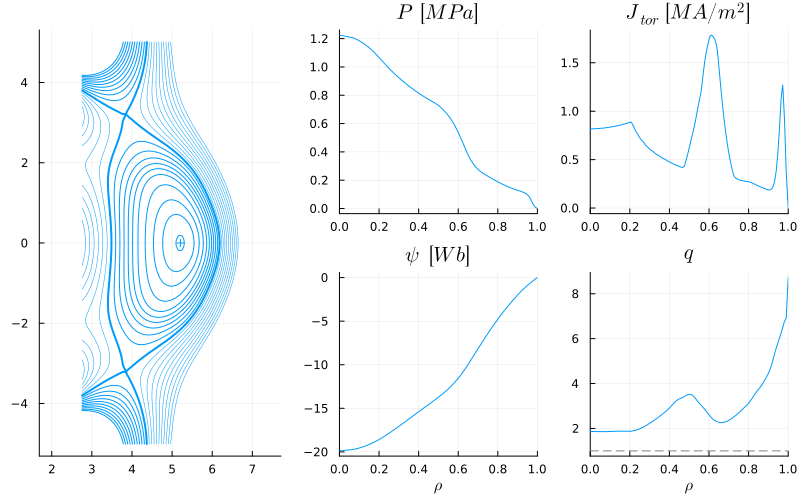

In [12]:
plot(dd.equilibrium, coordinate=:rho_tor_norm)

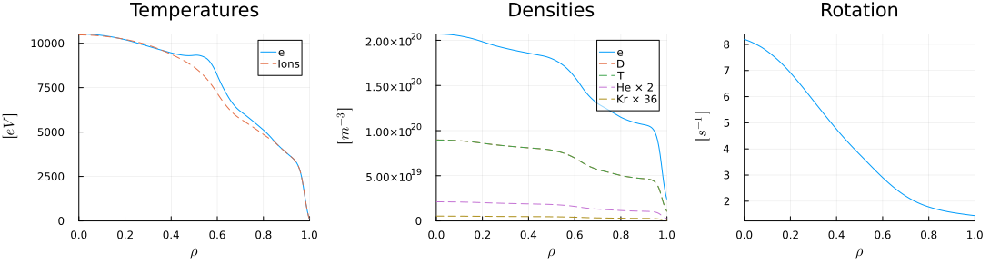

In [13]:
plot(dd.core_profiles)

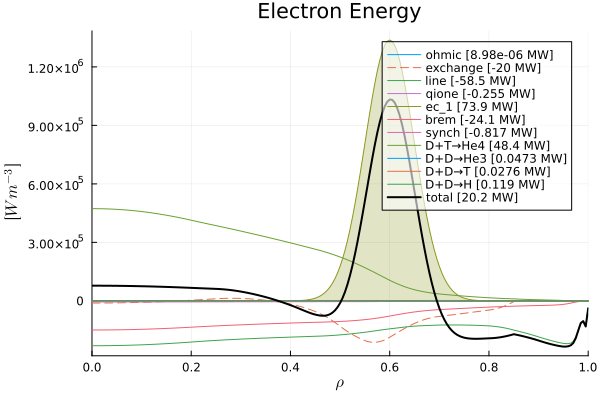

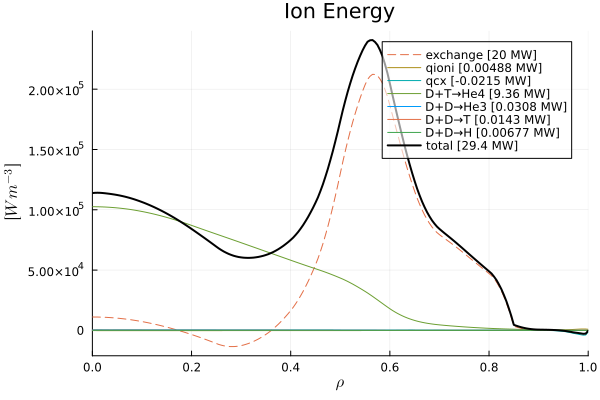

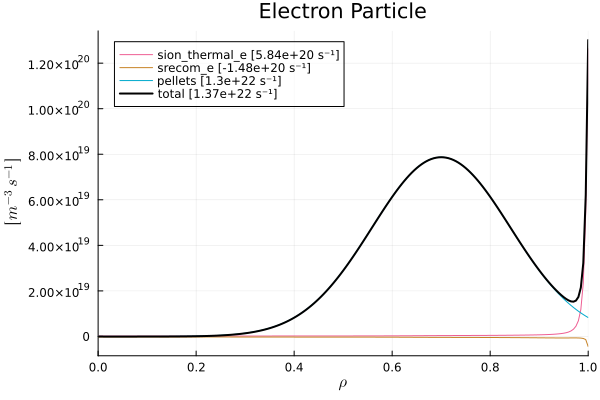

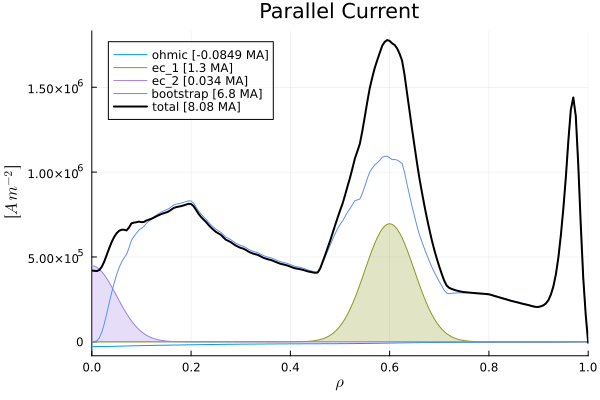

In [14]:
display(plot(dd.core_sources, only=1))
display(plot(dd.core_sources, only=2))
display(plot(dd.core_sources, only=3))
display(plot(dd.core_sources, only=4))

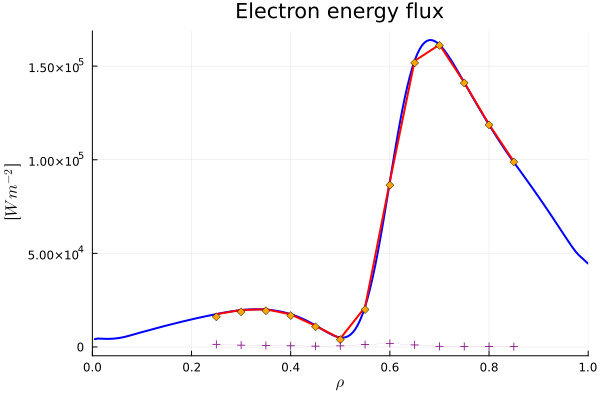

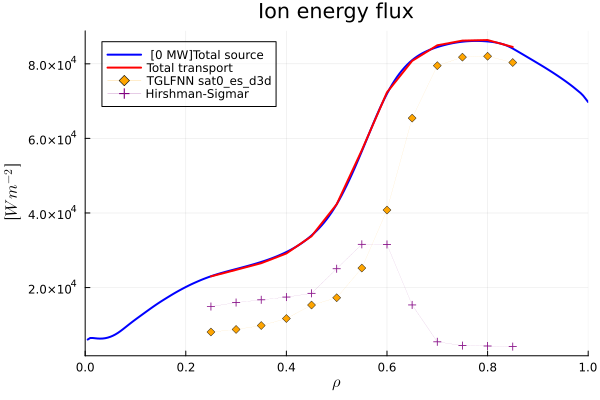

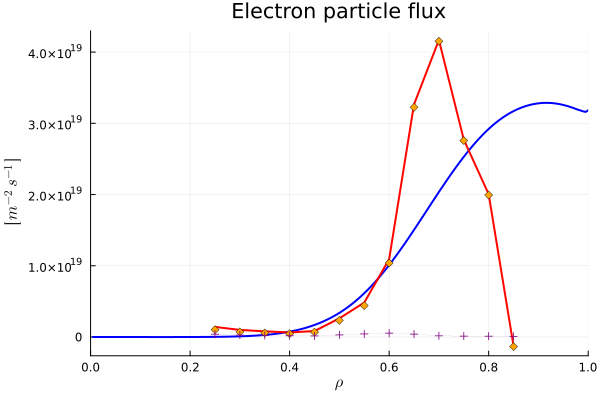

In [15]:
display(plot(dd.core_transport, only=1))
display(plot(dd.core_transport, only=2))
display(plot(dd.core_transport, only=3))

GEOMETRY                       EQUILIBRIUM                    TEMPERATURES                   DENSITIES                      
───────────────────────────    ───────────────────────────    ───────────────────────────    ───────────────────────────    


R0 → 4.82 [m]                  B0 → 4.71 [T]                  Te0 → 20.6 [keV]               ne0 → 2.07e+20 [m⁻³]           
a → 1.38 [m]                   ip → 8 [MA]                    Ti0 → 16.8 [keV]               ne_ped → 9.4e+19 [m⁻³]         
1/ϵ → 3.5                      q95 → 5.73                     <Te> → 9.49 [keV]              <ne> → 1.45e+20 [m⁻³]          
κ → 2.31                       <Bpol> → 0.651 [T]             <Ti> → 8.42 [keV]              ne0/<ne> → 1.42                
δ → 0.698                      βpol_MHD → 2.63                Te0/<Te> → 2.17                fGW → 1.24                     
ζ → -0.1                       βtor_MHD → 0.0527              Ti0/<Ti> → 2                   zeff_ped → 0                   
Volume → 352 [m³]              βn_MHD → 4.38                                                 <zeff> → 2                     
Surface → 421 [m²]                                                                                                          


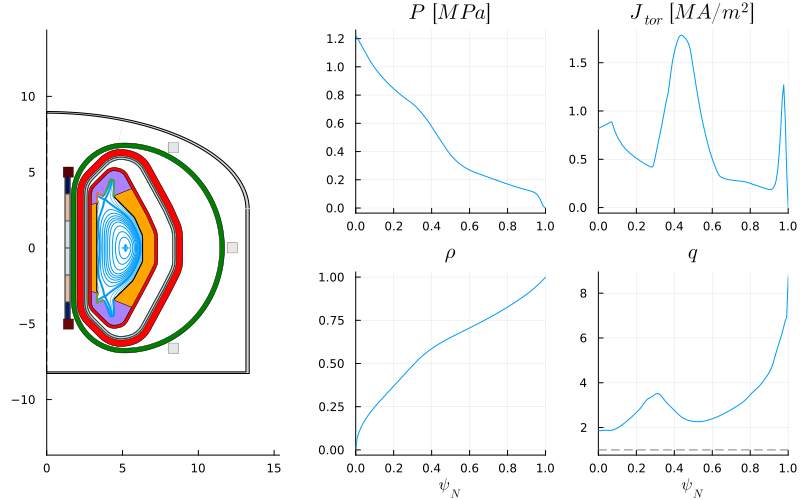

Nb3Sn            
PLH → 41.2 [MW]                ip_ni → 7.99 [MA]              Qfusion → Inf                  TF_material → ReBCO            
Bpol_omp → 1.1 [T]             ip_bs → 6.65 [MA]              Pelectric_net → NaN [MW]       OH_material → ReBCO            
λq → 0.969 [mm]                ip_aux → 1.34 [MA]             Qplant → NaN                   TF_max_b → NaN [T]             
qpol → 1.28e+03 [MW/m^2]       ip_ohm → 0.0578 [MA]           ηthermal_cycle → NaN           OH_max_b → NaN [T]             
qpar → 4.45e+03 [MW/m^2]       ejima → 0.4                    TBR → NaN                      TF_j_margin → NaN              
P/R0 → 9.98 [MW/m]             flattop → NaN [Hours]                                         OH_j_margin → NaN              
PB/R0 → 47 [MW T/m]                                                                          TF_stress_margin → NaN         
PBp/R0 → 6.5 [MW T/m]                                                                        OH_stress_marg

28×9 DataFrame
 Row │ group   details               type      ΔR         R_start   R_end     material      area       volume     
     │ String  String                String    Float64    Float64   Float64   String        Float64    Float64    
─────┼────────────────────────────────────────────────────────────────────────────────────────────────────────────
   1 │ in                                      1.19809     0.0       1.19809                12.7627      48.0378
   2 │ in                            oh        0.353728    1.19809   1.55182  ReBCO          3.76811     32.5531
   3 │ in                                      0.0696425   1.55182   1.62146                 0.741872     7.39583
   4 │ hfs                           tf        0.310634    1.62146   1.93209  ReBCO         11.8393     143.725
   5 │ hfs                                     0.0696425   1.93209   2.00174                31.5504    1736.81
   6 │ hfs     low temp              shield    0.428648    2.00174   2.43038 

​


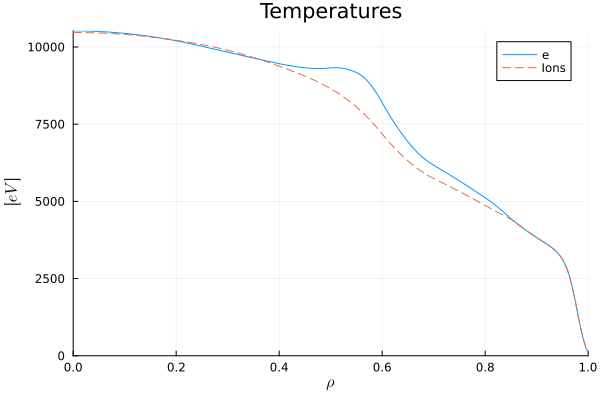

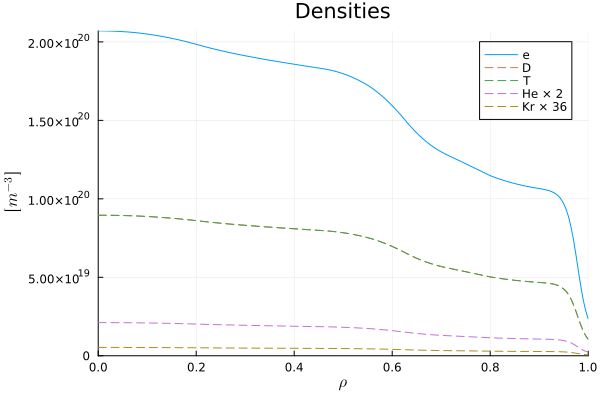

​
​


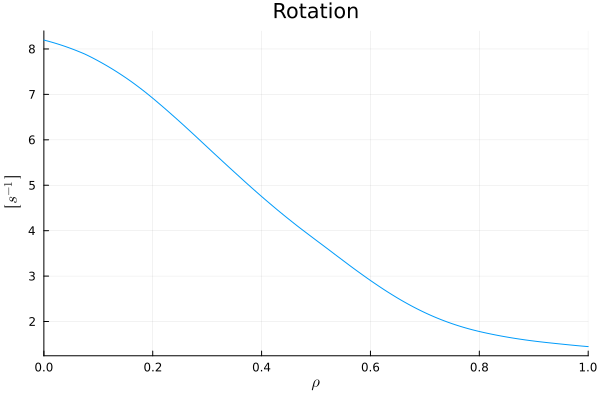

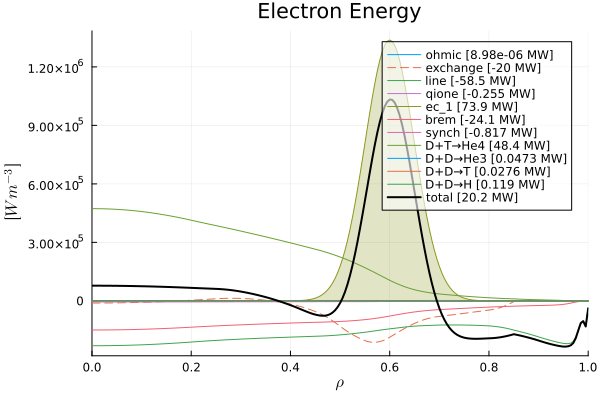

​
​


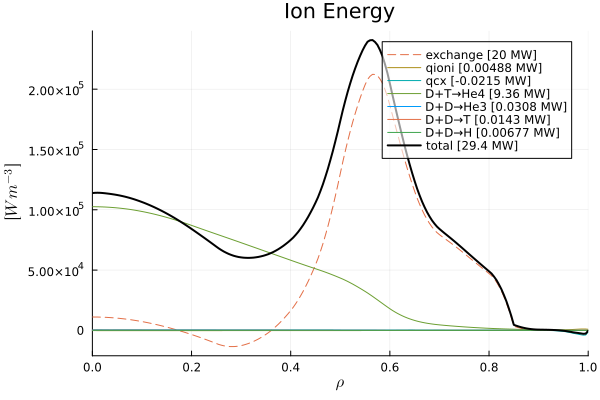

​


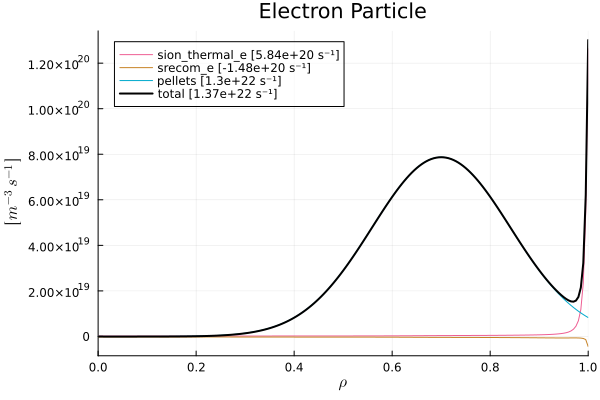

​


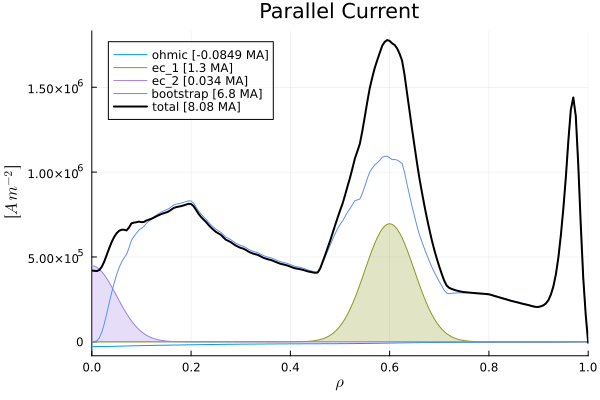

​


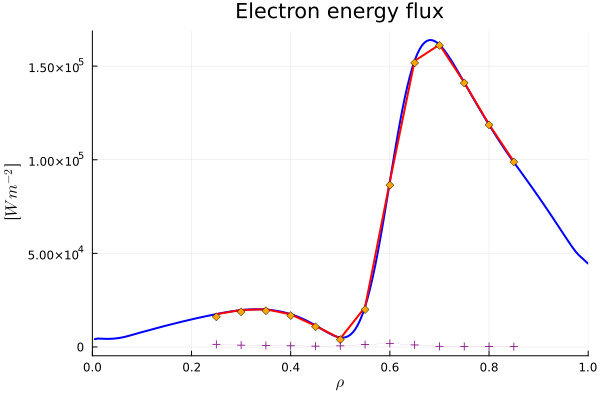

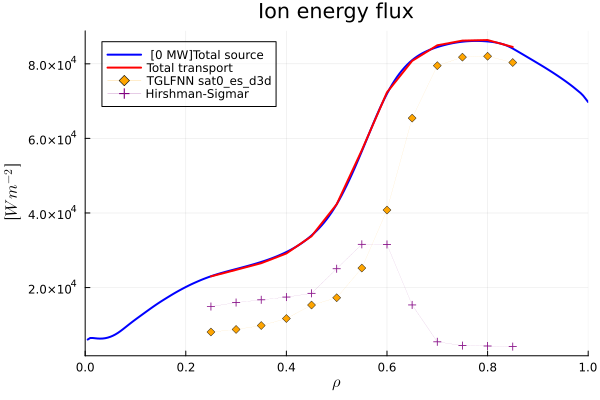

​
​


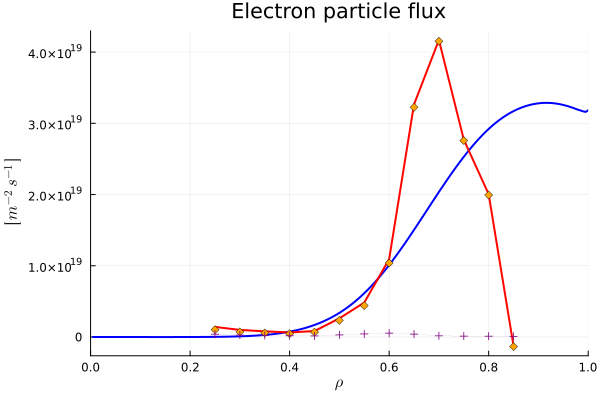

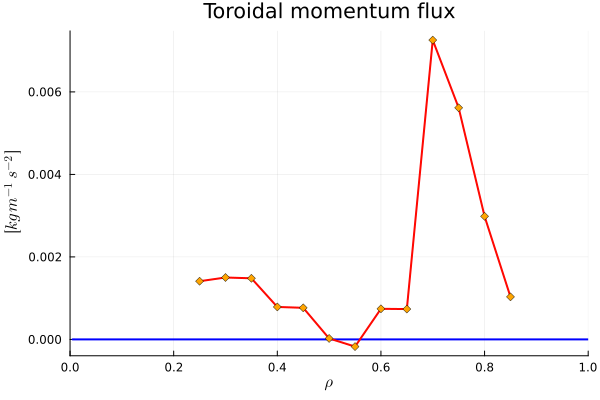

​
​


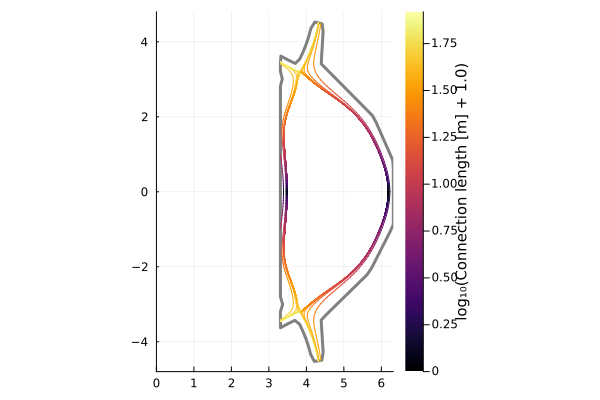

​


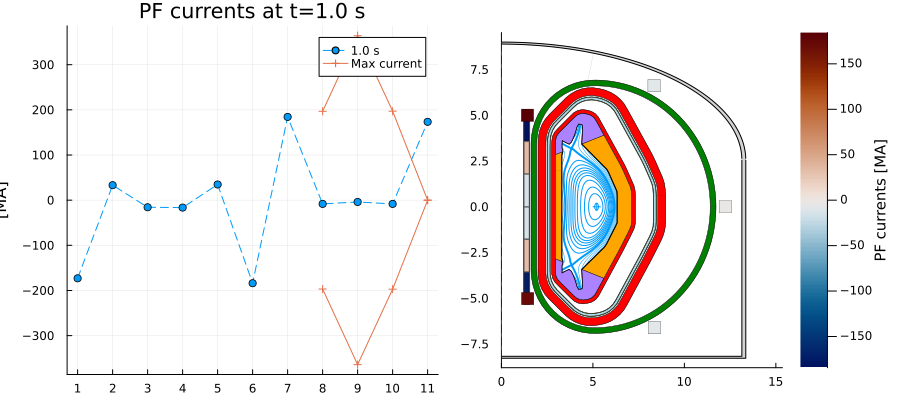

​


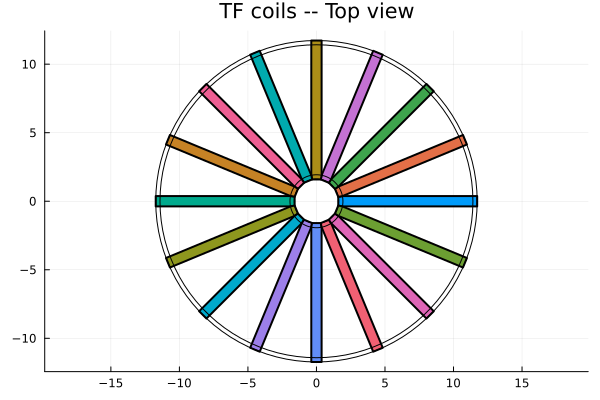

​


In [16]:
FUSE.digest(dd);